In [1]:
# !pip install dcor
# !pip install git+https://github.com/Shafi2016/pypdc_sis.git

In [2]:
# # Load the dataset
# df = pd.read_csv('./official_data.csv')

# # Count the number of rows and columns
# rows, columns = df.shape

# rows, columns


# # Count the number of rows and columns excluding 'Date' and 'GDP' columns
# df_excluded = df.drop(columns=['date', 'GDP'], errors='ignore')

# rows_excluded, columns_excluded = df_excluded.shape

# rows_excluded, columns_excluded


In [3]:
import pandas as pd
import numpy as np
from pypdc_sis import PDC_SIS

# Load the dataset


import logging
# Load the dataset
df = pd.read_csv('./official_data.csv')

# Extracting the GDP column as the target variable 'Y'
gdp = df['GDP']

# Extracting the predictors
data = df.iloc[:, 2:99]



# Creating lagged variables up to Lag 3
PredictLag3 = data.assign(**{
    f"{col}_lag{i}": data[col].shift(i) for i in range(1, 4) for col in data
}).reindex(columns=sorted(data.columns.tolist() + [f"{col}_lag{i}" for i in range(1, 4) for col in data], key=lambda x: (len(x), x)))

# Adjusting 'Xwl' to exclude rows with NAs introduced by lagging, ensuring alignment with 'Y'
Xwl = PredictLag3.dropna().to_numpy()

# Now, we need to adjust 'gdp' to match the number of rows in 'Xwl'
# Drop the same rows with NaNs in 'gdp' as those dropped in the predictors
Y = gdp[PredictLag3.notna().all(axis=1)].to_numpy()

# Check if the shapes of Xwl and Y match
print(f"Shape of Xwl: {Xwl.shape}, Shape of Y: {Y.shape}")

# Apply the function (PDC_SIS)
results = PDC_SIS(Xwl, Y, lags=3, top_n=10)

# Retrieve the original names for the selected columns
selected_indices = results['indices']
original_column_names = PredictLag3.dropna().columns[selected_indices]

# Select the columns from PredictLag3 based on selected indices
selected_columns_df = PredictLag3[original_column_names]

# View the first few rows of the combined data frame
print(selected_columns_df.head())


C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\1577527913.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  PredictLag3 = data.assign(**{
C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\1577527913.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  PredictLag3 = data.assign(**{
C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\1577527913.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performan

Shape of Xwl: (209, 388), Shape of Y: (209,)
   TOT_HRS_CAN   EMP_CAN  EMP_SERV_CAN  GOOD_HRS_CAN  UNEMP_CAN  Exp_BP_new  \
0     0.000469  0.000979      0.000311      0.011304        0.0    0.067727   
1     0.001673  0.000776     -0.000926      0.003570        0.0    0.010286   
2     0.001497  0.002464      0.002113      0.005275       -0.1    0.037758   
3     0.004701  0.001296      0.000891      0.006556       -0.1    0.025240   
4    -0.000725  0.001131      0.001653     -0.006586        0.1    0.033259   

   EMP_SALES_CAN  EX_TRANSP_BP_new  Imp_BP_new  EX_IND_EQUIP_BP_new  
0      -0.000562          0.091246    0.061273             0.105986  
1       0.000883          0.061040    0.018651             0.010906  
2      -0.005066          0.031315    0.008372             0.033143  
3      -0.000403          0.012741    0.070923             0.021997  
4       0.003140          0.017993   -0.041402             0.002278  


C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\1331648472.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  PredictLag3 = data.assign(**{
C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\1331648472.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  PredictLag3 = data.assign(**{
C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\1331648472.py:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performan

Shape of Xwl: (209, 388), Shape of Y: (209,)

Processing tau=1
Rolling window: Start=0, End=100, tau=1
         date    target
0  2004-05-01  0.004531
1  2004-06-01  0.000698
2  2004-07-01  0.004559
3  2004-08-01  0.002773
4  2004-09-01  0.001207
Train size: 81, Validation size: 16, Test size: 1
Rolling window: Start=1, End=101, tau=1
         date    target
1  2004-06-01  0.000698
2  2004-07-01  0.004559
3  2004-08-01  0.002773
4  2004-09-01  0.001207
5  2004-10-01  0.001471
Train size: 81, Validation size: 16, Test size: 1
Rolling window: Start=2, End=102, tau=1
         date    target
2  2004-07-01  0.004559
3  2004-08-01  0.002773
4  2004-09-01  0.001207
5  2004-10-01  0.001471
6  2004-11-01  0.000511
Train size: 81, Validation size: 16, Test size: 1
Rolling window: Start=3, End=103, tau=1
         date    target
3  2004-08-01  0.002773
4  2004-09-01  0.001207
5  2004-10-01  0.001471
6  2004-11-01  0.000511
7  2004-12-01  0.004109
Train size: 81, Validation size: 16, Test size: 1
R

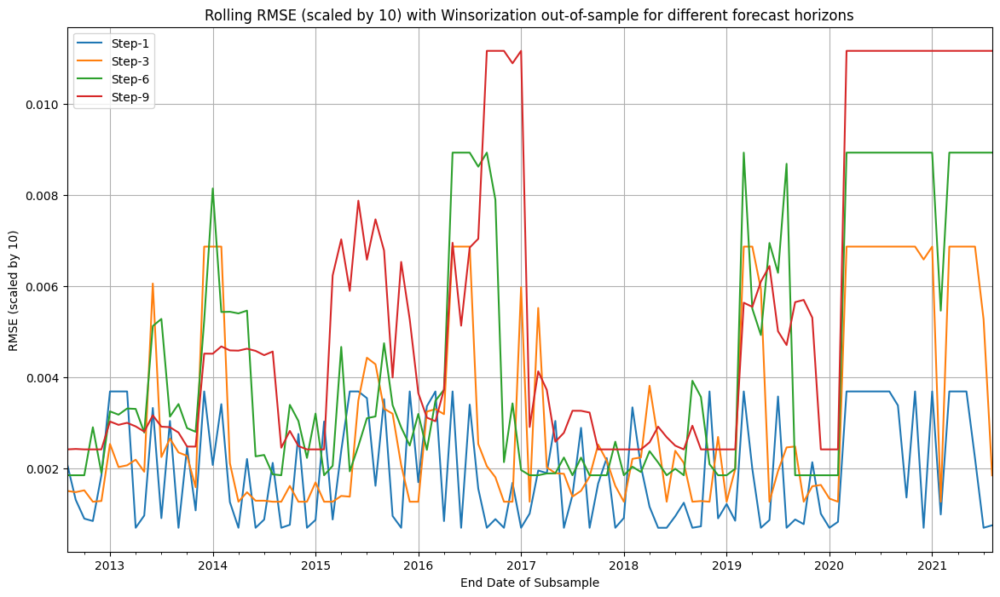

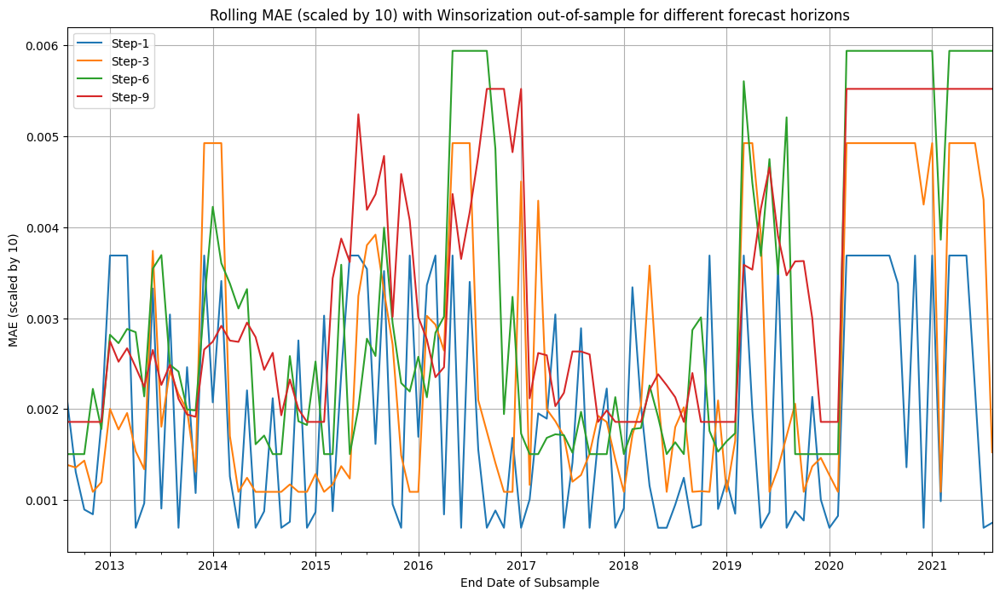

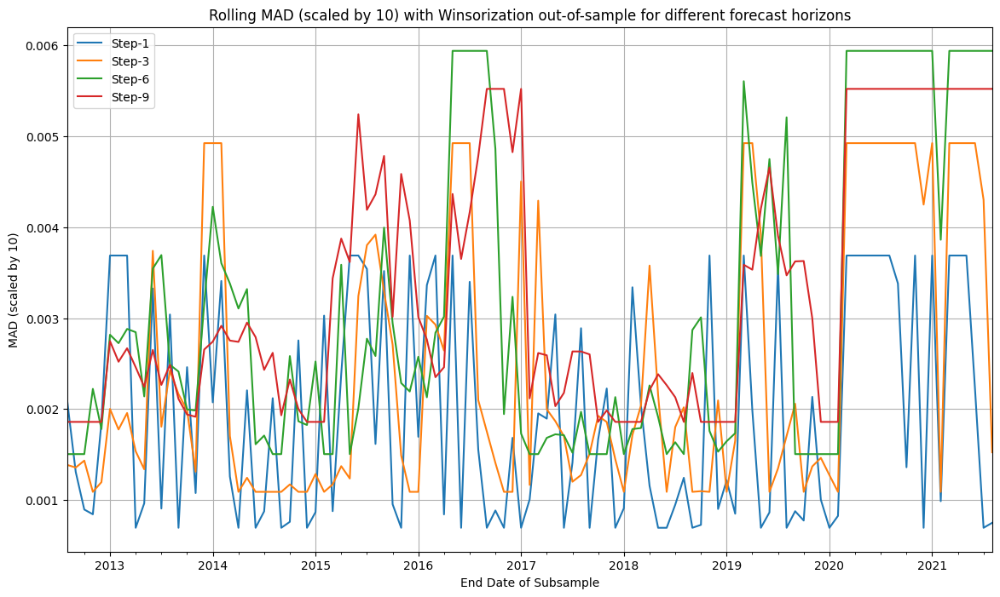

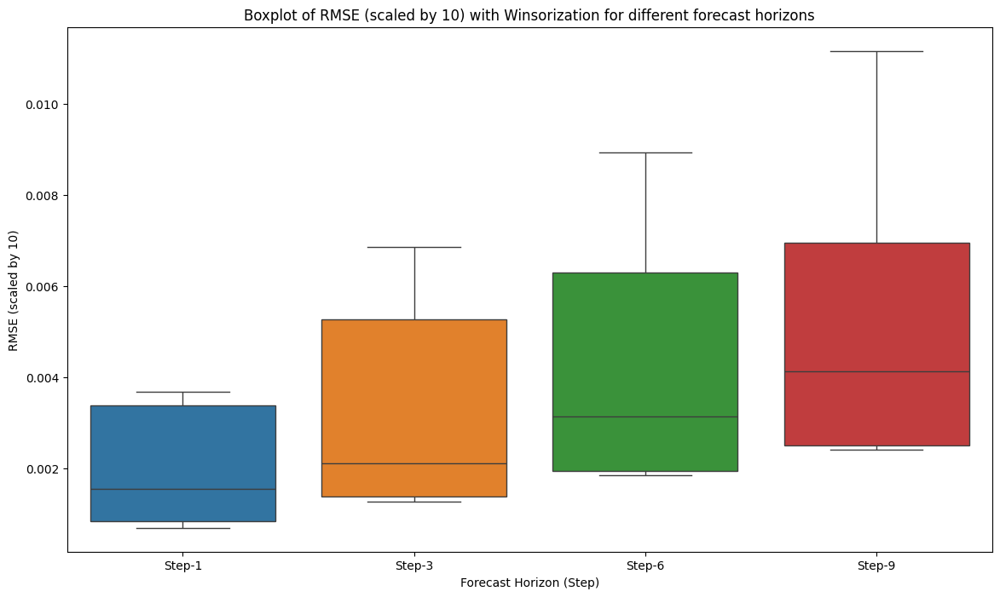

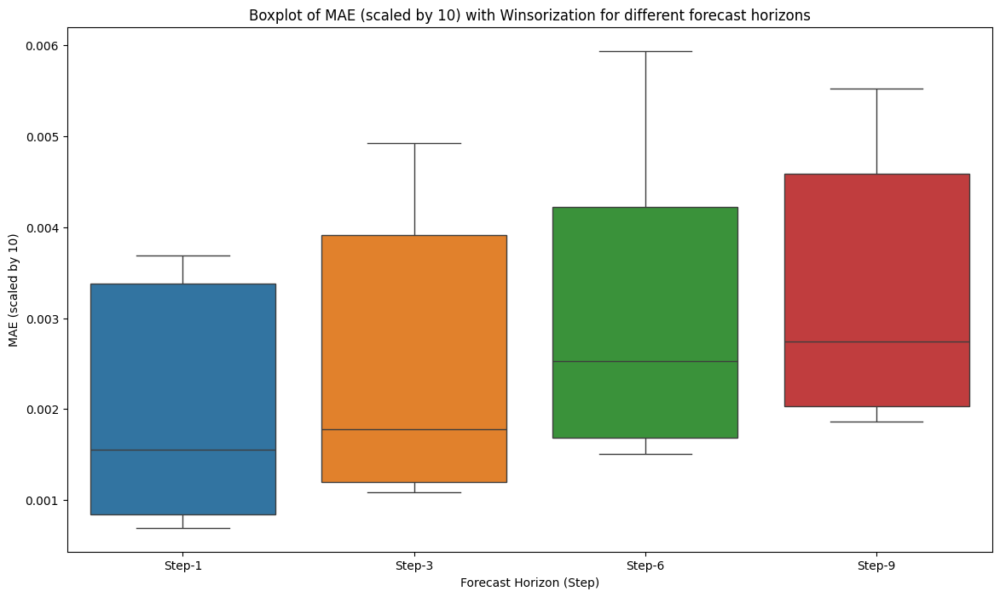

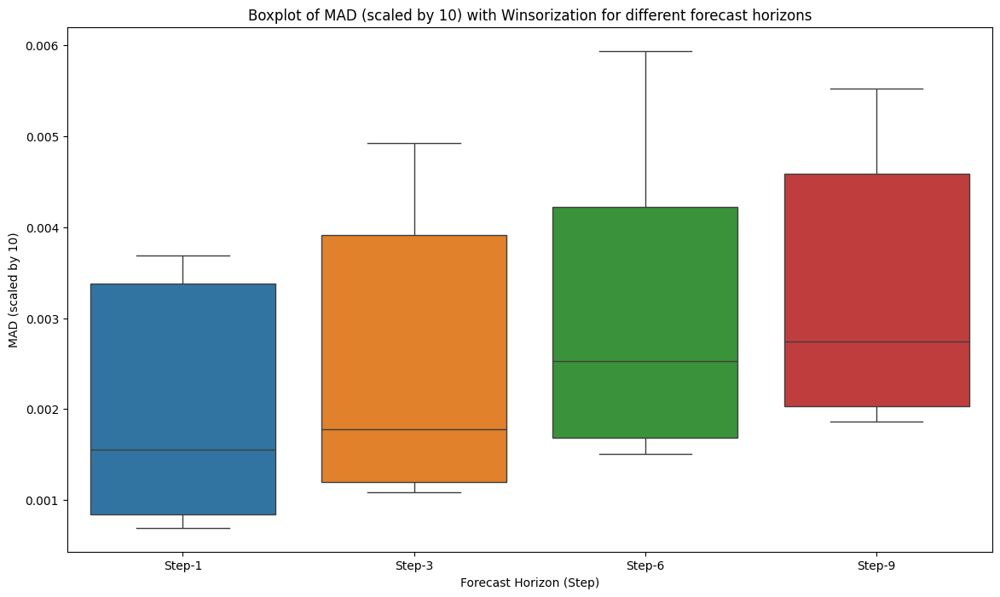

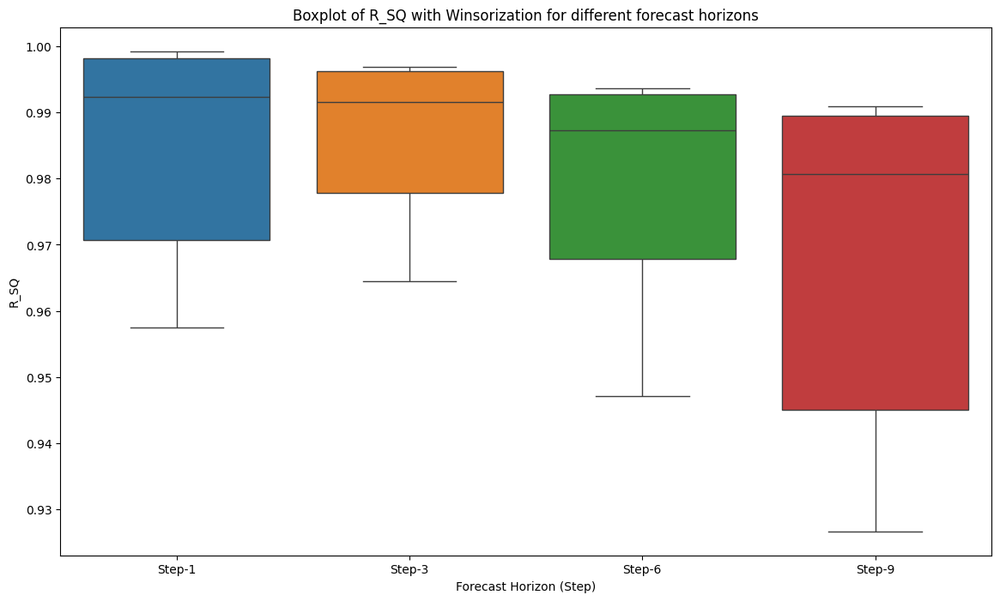

Updated code execution completed.


In [5]:
### RF
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from pypdc_sis import PDC_SIS  # Assuming this is the function you're using
from scipy.stats import mstats

### Part 1: Data Preparation
# Load the dataset
df = pd.read_csv('./official_data.csv')

# Extracting the GDP column as the target variable 'Y'
gdp = df['GDP']

# Extracting the predictors
data = df.iloc[:, 2:99]

# Creating lagged variables up to Lag 3
PredictLag3 = data.assign(**{
    f"{col}_lag{i}": data[col].shift(i) for i in range(1, 4) for col in data
}).reindex(columns=sorted(data.columns.tolist() + [f"{col}_lag{i}" for i in range(1, 4) for col in data], key=lambda x: (len(x), x)))

# Create a mask for non-NA rows
mask = PredictLag3.notna().all(axis=1)

# Apply the mask consistently to both X and Y
Xwl = PredictLag3[mask].to_numpy()
Y = gdp[mask].to_numpy()

print(f"Shape of Xwl: {Xwl.shape}, Shape of Y: {Y.shape}")

# Combine the date column with the predictors
dates = df['date'][mask].reset_index(drop=True)
Xwl_df = pd.DataFrame(Xwl, columns=PredictLag3.columns)
Xwl_df.insert(0, 'date', dates)

# Prepare the dataframe for rolling window analysis
df_combined = pd.concat([Xwl_df.reset_index(drop=True), pd.Series(Y, name='GDP')], axis=1)

# Function to train and fit RandomForest model with hyperparameter tuning using RandomizedSearchCV
def tune_and_fit(X_train, y_train):
    # Define the parameter grid for tuning
    param_distributions = {
        'n_estimators': [50, 100, 200],
        'max_depth': [5, 10, 20, None],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'bootstrap': [True, False]
    }
    
    rf = RandomForestRegressor(random_state=42)
    random_search = RandomizedSearchCV(estimator=rf, param_distributions=param_distributions, 
                                       n_iter=10, cv=3, n_jobs=-1, random_state=42, scoring='neg_mean_squared_error')
    random_search.fit(X_train, y_train)
    
    return random_search.best_estimator_

# Function to calculate out-of-sample performance metrics
def OoS_metrics(y_true, y_pred, y_train_mean):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mad = np.mean(np.abs(y_true - y_pred))
    sse = np.sum((y_true - y_pred) ** 2)
    sst = np.sum((y_true - y_train_mean) ** 2)
    
    # Handle the case where SST is zero to avoid division by zero
    if sst == 0:
        r_sq = np.nan  # Or set to 0, depending on how you want to handle it
    else:
        r_sq = 1 - (sse / sst)
    return rmse, mae, mad, r_sq

# Function to calculate rolling-window OoS performance for 'tau'-steps ahead forecasts
def OoS_R_sq(df, tau, wsize, sstart, T1, ylag, sratio=0.80):
    """
    Calculate rolling-window out-of-sample performance for 'tau'-steps ahead forecasts.

    Parameters:
    df (DataFrame): DataFrame containing the date column and predictors.
    tau (int): Forecast horizon (number of steps ahead).
    wsize (int): Rolling window size.
    sstart (int): Start index for the subsample.
    T1 (int): Subsample size.
    ylag (int): Number of lags for the target variable.

    Returns:
    tuple: (rmse, mae, mad, r_sq, selected_features_current_window) performance metrics.
    """
    # Ensure the subsample size and indices are valid
    assert T1 > wsize + tau, "Size of subsample must be greater than window size plus tau!"
    assert sstart + T1 <= len(df), "End point of the last subsample must be <= size of the dataframe!"

    # Debugging: Print current start and end indices for the rolling window
    print(f"Rolling window: Start={sstart}, End={sstart + T1}, tau={tau}")

    # Extract the subsample from the dataframe
    df_sub = df.iloc[sstart:(sstart + T1), :].copy()

    # Correct the target label by shifting it backward by 'tau' steps to align features with future targets
    df_sub['target'] = df_sub['GDP'].shift(-tau)  # Corrected shift

    df_sub.dropna(inplace=True)  # Drop rows with NaN values caused by shifting

    # Debugging: Print the first few rows of the subsample to check alignment
    print(df_sub[['date', 'target']].head(5))

    # If ylag > 0, create lagged versions of the target variable
    if ylag > 0:
        for i in range(1, ylag + 1):
            df_sub[f'ylag{i}'] = df_sub['target'].shift(i)
        df_sub.dropna(inplace=True)

    # Extract the target variable and features
    feature_columns = df_sub.columns[1:-1]  # Exclude 'date', 'GDP', and 'target'
    R = np.array(df_sub['target'], dtype='float64')
    X = df_sub[feature_columns].to_numpy(dtype='float64')

    # Splitting data into train, validation, and test sets
    T = X.shape[0]
    validation_size = 16  # Fixed validation size
    test_size = tau  # Set test size to forecast horizon
    train_size = T - validation_size - test_size

    if train_size <= 0:
        raise ValueError("Training size is non-positive. Adjust T1 or sstart.")

    # Split the data
    X_train = X[:train_size]
    y_train = R[:train_size]

    X_valid = X[train_size:train_size + validation_size]
    y_valid = R[train_size:train_size + validation_size]

    X_test = X[train_size + validation_size:train_size + validation_size + test_size]
    y_test = R[train_size + validation_size:train_size + validation_size + test_size]

    if len(y_test) < test_size:
        raise ValueError("Not enough data for the test set. Adjust T1 or sstart.")

    # Debugging: Print the sizes of the splits
    print(f"Train size: {X_train.shape[0]}, Validation size: {X_valid.shape[0]}, Test size: {X_test.shape[0]}")

    # Apply PDC-SIS on X_train and y_train to select top 8 features
    top_n_pdc_sis = min(8, X_train.shape[1])  # Select top 8 features or fewer if less features are available
    results = PDC_SIS(X_train, y_train, lags=3, top_n=top_n_pdc_sis)

    # Check if 'indices' is in results
    if 'indices' not in results or results['indices'] is None:
        raise ValueError("PDC_SIS did not return any feature indices.")

    # Retrieve indices of top 8 features
    selected_indices = results['indices']
    selected_feature_names = feature_columns[selected_indices]

    # Keep track of selected features
    selected_features_current_window = selected_feature_names.tolist()

    # Transform X_train, X_valid, X_test to have only selected features
    X_train_selected = X_train[:, selected_indices]
    X_valid_selected = X_valid[:, selected_indices]
    X_test_selected = X_test[:, selected_indices]

    # Train the model with hyperparameter tuning using RandomizedSearchCV
    model = tune_and_fit(X_train_selected, y_train)

    # Predict on the test set
    y_pred = model.predict(X_test_selected)

    # Compute the mean of the training target values (baseline forecast)
    y_train_mean = np.mean(y_train)

    # Calculate out-of-sample performance metrics using the correct R-squared formula
    rmse, mae, mad, r_sq = OoS_metrics(y_test, y_pred, y_train_mean)
    # After making predictions, store actual and predicted values along with dates
    test_dates = df_sub.iloc[train_size + validation_size:train_size + validation_size + test_size]['date']
    forecast_results = pd.DataFrame({
        'date': test_dates,
        'actual': y_test,
        'predicted': y_pred,
        'sstart': sstart,
        'window_end': df.iloc[sstart + T1 - 1]['date']
    })
    
    # Calculate metrics
    rmse, mae, mad, r_sq = OoS_metrics(y_test, y_pred, y_train_mean)
    
    return rmse, mae, mad, r_sq, selected_features_current_window, forecast_results

def OoS_R_sq_many_ssamples(df, tau, step_size, wsize, T1, ylag, sratio=0.80):
    ssize = len(df) - ylag
    perf_dict = {
        'sstart': [], 'ssample_end_date': [], 
        'rmse': [], 'mae': [], 'mad': [], 'r_sq': [], 
        'selected_features': []
    }
    
    # Add this line to store all forecasts
    all_forecasts = []
    
    for sstart in range(0, ssize + step_size, step_size):
        if sstart + T1 <= ssize:
            try:
                # Update function call to include forecast_results
                rmse, mae, mad, r_sq, selected_features, forecast_results = OoS_R_sq(
                    df, tau, wsize, sstart, T1, ylag, sratio
                )
                perf_dict['sstart'].append(sstart)
                perf_dict['ssample_end_date'].append(df.iloc[sstart + T1 - 1]['date'])
                perf_dict['rmse'].append(rmse)
                perf_dict['mae'].append(mae)
                perf_dict['mad'].append(mad)
                perf_dict['r_sq'].append(r_sq)
                perf_dict['selected_features'].append(selected_features)
                
                # Add this line to collect forecast results
                all_forecasts.append(forecast_results)
                
            except Exception as e:
                print(f"An error occurred at sstart={sstart}: {e}")
    
    # Add this section to combine and return forecasts
    if all_forecasts:
        combined_forecasts = pd.concat(all_forecasts, ignore_index=True)
        return perf_dict, combined_forecasts
    return perf_dict, None 

# Define parameters
wsize = 75  # Rolling window size
T1 = 100    # Subsample size
step_size = 1
ylag = 1

# Create a directory to save results
output_dir = './OoS_metrics_rf_off'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Step 2: Calculate performance for different forecast horizons (tau) and save the results
taus = [1, 3, 6, 9]
results = {}

for tau in taus:
    print(f"\nProcessing tau={tau}")
    result, forecasts = OoS_R_sq_many_ssamples(
        df_combined, tau=tau, step_size=step_size, 
        wsize=wsize, T1=T1, ylag=ylag
    )
    results[tau] = result
    
    # Save the regular metrics
    result_df = pd.DataFrame(result)
    result_df.to_csv(os.path.join(output_dir, f'OoS_metrics_tau_{tau}.csv'), index=False)
    
    # Save actual vs predicted values
    if forecasts is not None:
        forecasts_filename = os.path.join(output_dir, f'actual_vs_predicted_tau_{tau}.csv')
        forecasts.to_csv(forecasts_filename, index=False)


#### Winsorization ###########################################################################################################

def winsorize_data(data, limits=(0.20, 0.20)):
    # Apply Winsorization with given limits
    if len(data) == 0:
        return np.array([])
    return mstats.winsorize(data, limits=limits)

def winsorize_data_2(data, limits=(0.20, 0.20)):
    # Apply Winsorization with given limits
    if len(data) == 0:
        return np.array([])
    return mstats.winsorize(data, limits=limits)

# Step 3: Plot the rolling RMSE for each tau with Winsorization applied
plt.figure(figsize=(14, 8))
for tau, result in results.items():
    if result['rmse']:
        # Apply Winsorization to reduce the effect of outliers
        rmse_series = pd.Series(winsorize_data(np.array(result['rmse'])), index=pd.to_datetime(result['ssample_end_date'])) * 10  # Scale by 10
        rmse_series.plot(label=f'Step-{tau}')
    else:
        print(f"No RMSE data to plot for tau={tau}")

plt.title('Rolling RMSE (scaled by 10) with Winsorization out-of-sample for different forecast horizons')
plt.xlabel('End Date of Subsample')
plt.ylabel('RMSE (scaled by 10)')
plt.legend()
plt.grid(True)
plt.show()

# Rolling line chart for MAE
plt.figure(figsize=(14, 8))
for tau, result in results.items():
    if result['mae']:
        # Apply Winsorization to reduce the effect of outliers
        mae_series = pd.Series(winsorize_data(np.array(result['mae'])), index=pd.to_datetime(result['ssample_end_date'])) * 10  # Scale by 10
        mae_series.plot(label=f'Step-{tau}')
    else:
        print(f"No MAE data to plot for tau={tau}")

plt.title('Rolling MAE (scaled by 10) with Winsorization out-of-sample for different forecast horizons')
plt.xlabel('End Date of Subsample')
plt.ylabel('MAE (scaled by 10)')
plt.legend()
plt.grid(True)
plt.show()

# Rolling line chart for MAD
plt.figure(figsize=(14, 8))
for tau, result in results.items():
    if result['mad']:
        # Apply Winsorization to reduce the effect of outliers
        mad_series = pd.Series(winsorize_data(np.array(result['mad'])), index=pd.to_datetime(result['ssample_end_date'])) * 10  # Scale by 10
        mad_series.plot(label=f'Step-{tau}')
    else:
        print(f"No MAD data to plot for tau={tau}")

plt.title('Rolling MAD (scaled by 10) with Winsorization out-of-sample for different forecast horizons')
plt.xlabel('End Date of Subsample')
plt.ylabel('MAD (scaled by 10)')
plt.legend()
plt.grid(True)
plt.show()

# Step 4: Create box plots for all metrics, scaled by 10, with outlier handling
for metric in ['rmse', 'mae', 'mad']:
    plt.figure(figsize=(14, 8))
    data_to_plot = []
    for tau in taus:
        result = results[tau]
        if result[metric]:
            # Apply Winsorization to reduce the effect of outliers
            data = winsorize_data(np.array(result[metric]) * 10)
            data_to_plot.append(data)
        else:
            data_to_plot.append(np.array([]))
            print(f"No {metric.upper()} data for tau={tau}")

    sns.boxplot(data=data_to_plot)
    plt.title(f'Boxplot of {metric.upper()} (scaled by 10) with Winsorization for different forecast horizons')
    plt.xlabel('Forecast Horizon (Step)')
    plt.ylabel(f'{metric.upper()} (scaled by 10)')
    plt.xticks(ticks=range(len(taus)), labels=[f'Step-{tau}' for tau in taus])
    plt.show()

# Box plot for R-squared
for metric in ['r_sq']:
    plt.figure(figsize=(14, 8))
    data_to_plot = []
    for tau in taus:
        result = results[tau]
        if result[metric]:
            # Apply Winsorization using the new function to reduce the effect of outliers
            data = winsorize_data_2(np.array(result[metric]))
            data_to_plot.append(data)
        else:
            data_to_plot.append(np.array([]))
            print(f"No {metric.upper()} data for tau={tau}")

    sns.boxplot(data=data_to_plot)
    plt.title(f'Boxplot of {metric.upper()} with Winsorization for different forecast horizons')
    plt.xlabel('Forecast Horizon (Step)')
    plt.ylabel(f'{metric.upper()}')
    plt.xticks(ticks=range(len(taus)), labels=[f'Step-{tau}' for tau in taus])
    plt.show()

# Create directories to save metrics
output_dir_non_winsor = './OoS_metrics_rf_off/non_winsorized'
output_dir_winsor = './OoS_metrics_rf_off/winsorized'
os.makedirs(output_dir_non_winsor, exist_ok=True)
os.makedirs(output_dir_winsor, exist_ok=True)

# Step 5: Save non-winsorized and winsorized metrics
for tau in taus:
    result = results[tau]
    # Save the results to CSV for non-winsorized data
    result_df = pd.DataFrame(result)
    result_df.to_csv(os.path.join(output_dir_non_winsor, f'OoS_metrics_tau_{tau}_non_winsorized.csv'), index=False)

    # Apply Winsorization to reduce the effect of outliers and save adjusted metrics
    winsorized_result = {
        'sstart': result['sstart'],
        'ssample_end_date': result['ssample_end_date'],
        'rmse': winsorize_data(np.array(result['rmse'])).tolist() if result['rmse'] else [],
        'mae': winsorize_data(np.array(result['mae'])).tolist() if result['mae'] else [],
        'mad': winsorize_data(np.array(result['mad'])).tolist() if result['mad'] else [],
        'r_sq': winsorize_data_2(np.array(result['r_sq'])).tolist() if result['r_sq'] else [],
        'selected_features': result['selected_features']
    }
    winsorized_df = pd.DataFrame(winsorized_result)
    winsorized_df.to_csv(os.path.join(output_dir_winsor, f'OoS_metrics_tau_{tau}_winsorized.csv'), index=False)


      # Save all selected features for this tau into a single CSV file
    selected_features_df = pd.DataFrame({
        'sstart': result['sstart'],
        'ssample_end_date': result['ssample_end_date'],
        'selected_features': [', '.join(features) for features in result['selected_features']]
    })
    selected_features_filename = os.path.join(
        output_dir,
        f'selected_features_tau_{tau}.csv'
    )
    selected_features_df.to_csv(selected_features_filename, index=False)

print("Updated code execution completed.")


C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\2152493384.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  PredictLag3 = data.assign(**{
C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\2152493384.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  PredictLag3 = data.assign(**{
C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\2152493384.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performan

Shape of Xwl: (209, 388), Shape of Y: (209,)

Processing tau=1
Rolling window: Start=0, End=100, tau=1
         date    target
0  2004-05-01  0.004531
1  2004-06-01  0.000698
2  2004-07-01  0.004559
3  2004-08-01  0.002773
4  2004-09-01  0.001207
Train size: 81, Validation size: 16, Test size: 1


c:\ProgramData\anaconda3\envs\Langchain\lib\site-packages\joblib\externals\loky\process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Rolling window: Start=1, End=101, tau=1
         date    target
1  2004-06-01  0.000698
2  2004-07-01  0.004559
3  2004-08-01  0.002773
4  2004-09-01  0.001207
5  2004-10-01  0.001471
Train size: 81, Validation size: 16, Test size: 1
Rolling window: Start=2, End=102, tau=1
         date    target
2  2004-07-01  0.004559
3  2004-08-01  0.002773
4  2004-09-01  0.001207
5  2004-10-01  0.001471
6  2004-11-01  0.000511
Train size: 81, Validation size: 16, Test size: 1
Rolling window: Start=3, End=103, tau=1
         date    target
3  2004-08-01  0.002773
4  2004-09-01  0.001207
5  2004-10-01  0.001471
6  2004-11-01  0.000511
7  2004-12-01  0.004109
Train size: 81, Validation size: 16, Test size: 1
Rolling window: Start=4, End=104, tau=1
         date    target
4  2004-09-01  0.001207
5  2004-10-01  0.001471
6  2004-11-01  0.000511
7  2004-12-01  0.004109
8  2005-01-01  0.001127
Train size: 81, Validation size: 16, Test size: 1
Rolling window: Start=5, End=105, tau=1
         date    target


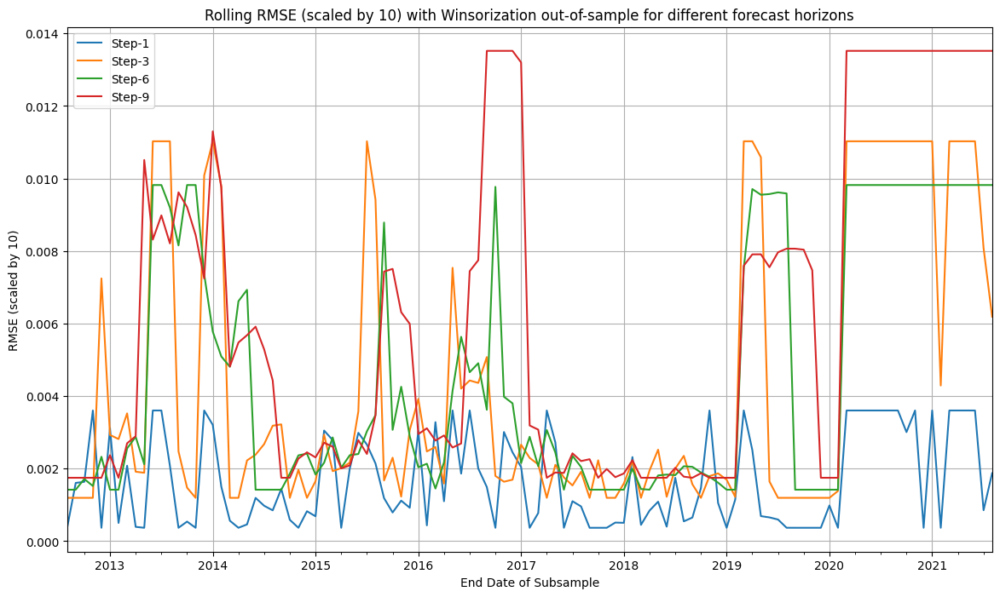

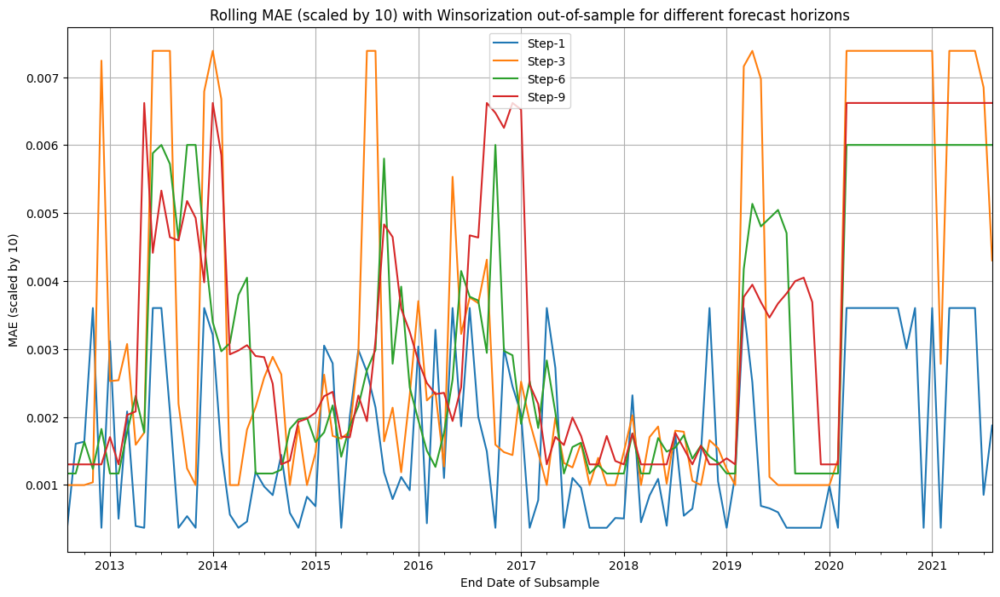

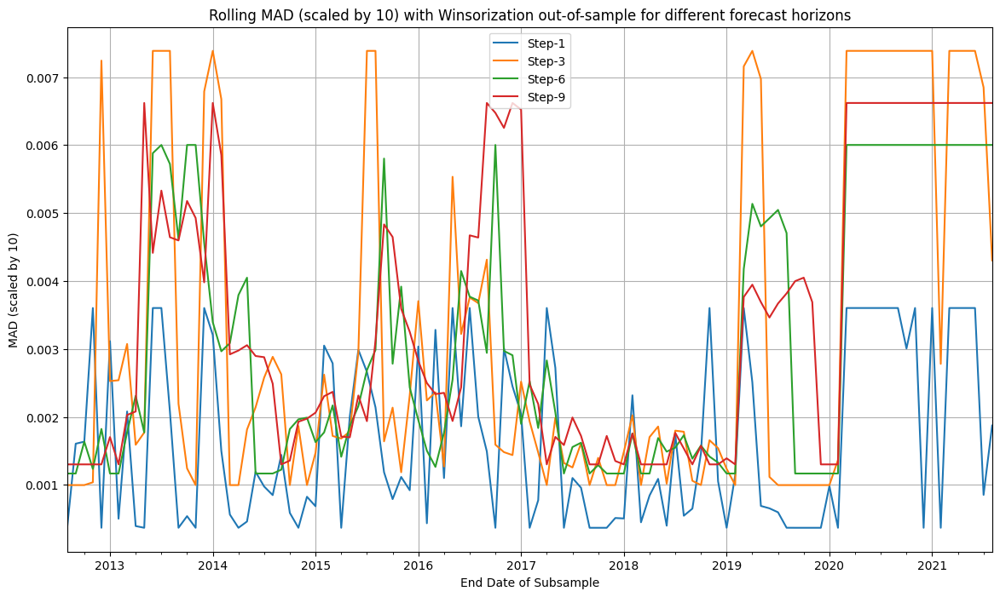

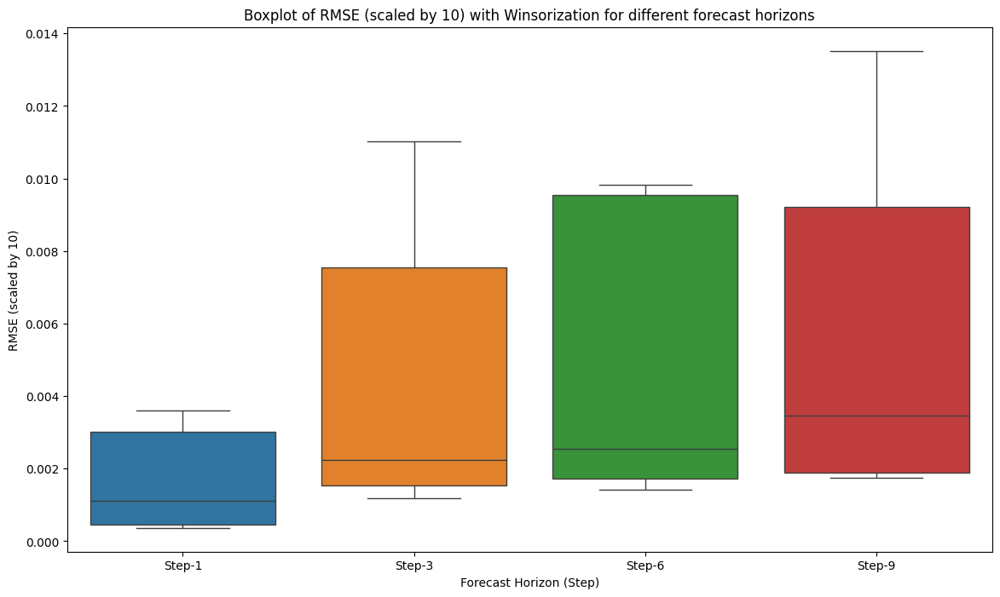

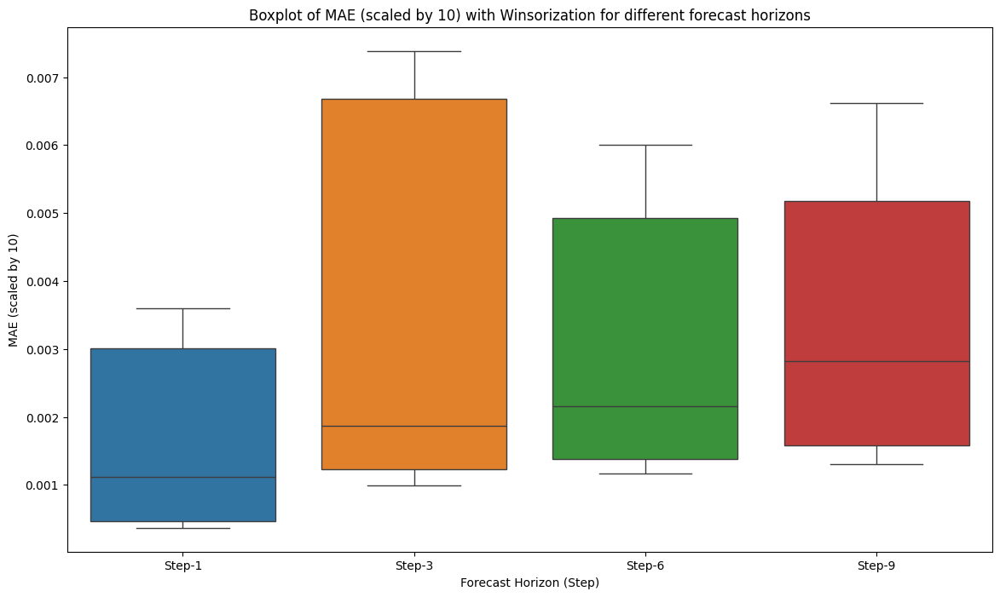

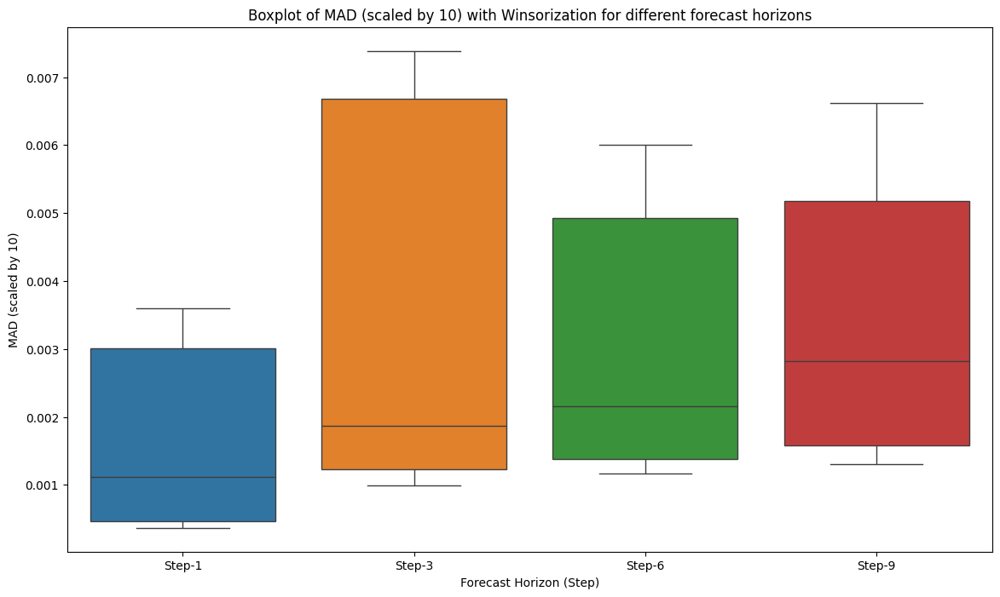

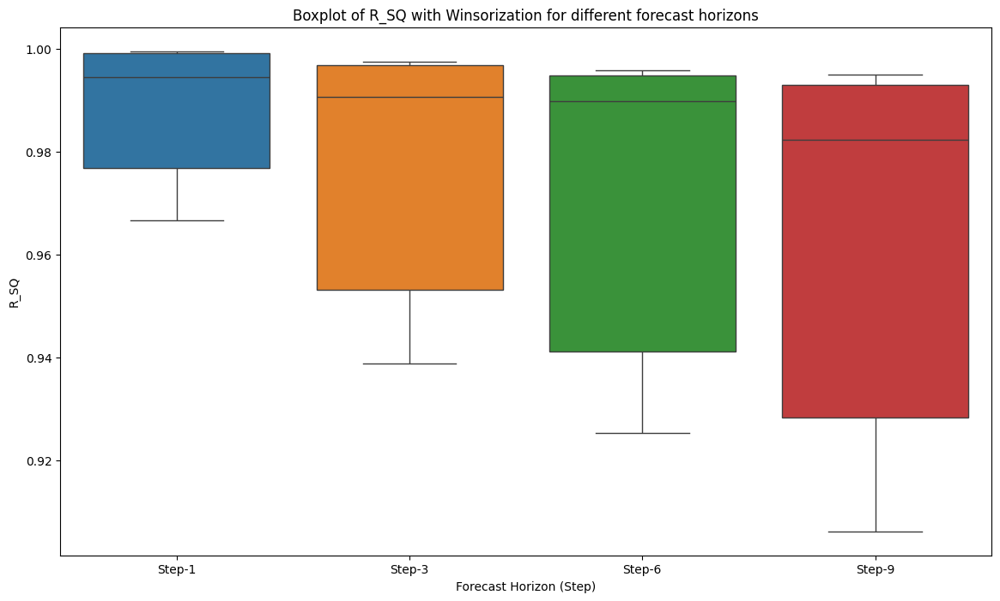

Updated code execution completed.


In [6]:
## xgboost


import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from pypdc_sis import PDC_SIS  # Assuming this is the function you're using
from scipy.stats import mstats
import xgboost as xgb
### Part 1: Data Preparation

# Load the dataset
df = pd.read_csv('./official_data.csv')

# Extracting the GDP column as the target variable 'Y'
gdp = df['GDP']

# Extracting the predictors
data = df.iloc[:, 2:99]

# Creating lagged variables up to Lag 3
PredictLag3 = data.assign(**{
    f"{col}_lag{i}": data[col].shift(i) for i in range(1, 4) for col in data
}).reindex(columns=sorted(data.columns.tolist() + [f"{col}_lag{i}" for i in range(1, 4) for col in data], key=lambda x: (len(x), x)))

# Create a mask for non-NA rows
mask = PredictLag3.notna().all(axis=1)

# Apply the mask consistently to both X and Y
Xwl = PredictLag3[mask].to_numpy()
Y = gdp[mask].to_numpy()

print(f"Shape of Xwl: {Xwl.shape}, Shape of Y: {Y.shape}")

# Combine the date column with the predictors
dates = df['date'][mask].reset_index(drop=True)
Xwl_df = pd.DataFrame(Xwl, columns=PredictLag3.columns)
Xwl_df.insert(0, 'date', dates)

# Prepare the dataframe for rolling window analysis
df_combined = pd.concat([Xwl_df.reset_index(drop=True), pd.Series(Y, name='GDP')], axis=1)

# Function to train and fit RandomForest model with hyperparameter tuning using RandomizedSearchCV
def finetune_xgboost(X_train, y_train):
    model = xgb.XGBRegressor()
    param_distributions = {
        'n_estimators': [100, 200, 300, 400, 500, 600, 1000],
        'max_depth': [3, 5, 7, 8, 10, 15],
        'learning_rate': [0.01, 0.03, 0.05, 0.1, 0.2],
        'subsample': [0.5, 0.6, 0.7, 0.8, 1.0],
        'colsample_bytree': [0.5, 0.6, 0.7, 0.8, 1.0]
    }
    random_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_distributions,
        cv=3,
        scoring='neg_mean_squared_error',
        n_jobs=-1,
        n_iter=50,  # Adjust n_iter to control the number of parameter settings tried
        random_state=42  # Ensures reproducibility
    )
    random_search.fit(X_train, y_train)
    return random_search.best_estimator_

# Function to calculate out-of-sample performance metrics
def OoS_metrics(y_true, y_pred, y_train_mean):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mad = np.mean(np.abs(y_true - y_pred))
    sse = np.sum((y_true - y_pred) ** 2)
    sst = np.sum((y_true - y_train_mean) ** 2)
    
    # Handle the case where SST is zero to avoid division by zero
    if sst == 0:
        r_sq = np.nan  # Or set to 0, depending on how you want to handle it
    else:
        r_sq = 1 - (sse / sst)
    return rmse, mae, mad, r_sq

# Function to calculate rolling-window OoS performance for 'tau'-steps ahead forecasts
def OoS_R_sq(df, tau, wsize, sstart, T1, ylag, sratio=0.80):
    """
    Calculate rolling-window out-of-sample performance for 'tau'-steps ahead forecasts.

    Parameters:
    df (DataFrame): DataFrame containing the date column and predictors.
    tau (int): Forecast horizon (number of steps ahead).
    wsize (int): Rolling window size.
    sstart (int): Start index for the subsample.
    T1 (int): Subsample size.
    ylag (int): Number of lags for the target variable.

    Returns:
    tuple: (rmse, mae, mad, r_sq, selected_features_current_window) performance metrics.
    """
    # Ensure the subsample size and indices are valid
    assert T1 > wsize + tau, "Size of subsample must be greater than window size plus tau!"
    assert sstart + T1 <= len(df), "End point of the last subsample must be <= size of the dataframe!"

    # Debugging: Print current start and end indices for the rolling window
    print(f"Rolling window: Start={sstart}, End={sstart + T1}, tau={tau}")

    # Extract the subsample from the dataframe
    df_sub = df.iloc[sstart:(sstart + T1), :].copy()

    # Correct the target label by shifting it backward by 'tau' steps to align features with future targets
    df_sub['target'] = df_sub['GDP'].shift(-tau)  # Corrected shift

    df_sub.dropna(inplace=True)  # Drop rows with NaN values caused by shifting

    # Debugging: Print the first few rows of the subsample to check alignment
    print(df_sub[['date', 'target']].head(5))

    # If ylag > 0, create lagged versions of the target variable
    if ylag > 0:
        for i in range(1, ylag + 1):
            df_sub[f'ylag{i}'] = df_sub['target'].shift(i)
        df_sub.dropna(inplace=True)

    # Extract the target variable and features
    feature_columns = df_sub.columns[1:-1]  # Exclude 'date', 'GDP', and 'target'
    R = np.array(df_sub['target'], dtype='float64')
    X = df_sub[feature_columns].to_numpy(dtype='float64')

    # Splitting data into train, validation, and test sets
    T = X.shape[0]
    validation_size = 16  # Fixed validation size
    test_size = tau  # Set test size to forecast horizon
    train_size = T - validation_size - test_size

    if train_size <= 0:
        raise ValueError("Training size is non-positive. Adjust T1 or sstart.")

    # Split the data
    X_train = X[:train_size]
    y_train = R[:train_size]

    X_valid = X[train_size:train_size + validation_size]
    y_valid = R[train_size:train_size + validation_size]

    X_test = X[train_size + validation_size:train_size + validation_size + test_size]
    y_test = R[train_size + validation_size:train_size + validation_size + test_size]

    if len(y_test) < test_size:
        raise ValueError("Not enough data for the test set. Adjust T1 or sstart.")

    # Debugging: Print the sizes of the splits
    print(f"Train size: {X_train.shape[0]}, Validation size: {X_valid.shape[0]}, Test size: {X_test.shape[0]}")

    # Apply PDC-SIS on X_train and y_train to select top 8 features
    top_n_pdc_sis = min(8, X_train.shape[1])  # Select top 8 features or fewer if less features are available
    results = PDC_SIS(X_train, y_train, lags=3, top_n=top_n_pdc_sis)

    # Check if 'indices' is in results
    if 'indices' not in results or results['indices'] is None:
        raise ValueError("PDC_SIS did not return any feature indices.")

    # Retrieve indices of top 8 features
    selected_indices = results['indices']
    selected_feature_names = feature_columns[selected_indices]

    # Keep track of selected features
    selected_features_current_window = selected_feature_names.tolist()

    # Transform X_train, X_valid, X_test to have only selected features
    X_train_selected = X_train[:, selected_indices]
    X_valid_selected = X_valid[:, selected_indices]
    X_test_selected = X_test[:, selected_indices]

    # Train the model with hyperparameter tuning using RandomizedSearchCV
    model = finetune_xgboost(X_train_selected, y_train)

    # Predict on the test set
    y_pred = model.predict(X_test_selected)

    # Compute the mean of the training target values (baseline forecast)
    y_train_mean = np.mean(y_train)

    # Calculate out-of-sample performance metrics using the correct R-squared formula
    rmse, mae, mad, r_sq = OoS_metrics(y_test, y_pred, y_train_mean)

    # After making predictions, store actual and predicted values along with dates
    test_dates = df_sub.iloc[train_size + validation_size:train_size + validation_size + test_size]['date']
    forecast_results = pd.DataFrame({
        'date': test_dates,
        'actual': y_test,
        'predicted': y_pred,
        'sstart': sstart,
        'window_end': df.iloc[sstart + T1 - 1]['date']
    })
    
    # Calculate metrics
    rmse, mae, mad, r_sq = OoS_metrics(y_test, y_pred, y_train_mean)
    
    return rmse, mae, mad, r_sq, selected_features_current_window, forecast_results

def OoS_R_sq_many_ssamples(df, tau, step_size, wsize, T1, ylag, sratio=0.80):
    ssize = len(df) - ylag
    perf_dict = {
        'sstart': [], 'ssample_end_date': [], 
        'rmse': [], 'mae': [], 'mad': [], 'r_sq': [], 
        'selected_features': []
    }
    
    # Add this line to store all forecasts
    all_forecasts = []
    
    for sstart in range(0, ssize + step_size, step_size):
        if sstart + T1 <= ssize:
            try:
                # Update function call to include forecast_results
                rmse, mae, mad, r_sq, selected_features, forecast_results = OoS_R_sq(
                    df, tau, wsize, sstart, T1, ylag, sratio
                )
                perf_dict['sstart'].append(sstart)
                perf_dict['ssample_end_date'].append(df.iloc[sstart + T1 - 1]['date'])
                perf_dict['rmse'].append(rmse)
                perf_dict['mae'].append(mae)
                perf_dict['mad'].append(mad)
                perf_dict['r_sq'].append(r_sq)
                perf_dict['selected_features'].append(selected_features)
                
                # Add this line to collect forecast results
                all_forecasts.append(forecast_results)
                
            except Exception as e:
                print(f"An error occurred at sstart={sstart}: {e}")
    
    # Add this section to combine and return forecasts
    if all_forecasts:
        combined_forecasts = pd.concat(all_forecasts, ignore_index=True)
        return perf_dict, combined_forecasts
    return perf_dict, None 


# Define parameters
wsize = 75  # Rolling window size
T1 = 100    # Subsample size
step_size = 1
ylag = 1

# Create a directory to save results
output_dir = './OoS_metrics_xgboost_off'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Step 2: Calculate performance for different forecast horizons (tau) and save the results
taus = [1, 3, 6, 9]
results = {}

for tau in taus:
    print(f"\nProcessing tau={tau}")
    result, forecasts = OoS_R_sq_many_ssamples(
        df_combined, tau=tau, step_size=step_size, 
        wsize=wsize, T1=T1, ylag=ylag
    )
    results[tau] = result
    
    # Save the regular metrics
    result_df = pd.DataFrame(result)
    result_df.to_csv(os.path.join(output_dir, f'OoS_metrics_tau_{tau}.csv'), index=False)
    
    # Save actual vs predicted values
    if forecasts is not None:
        forecasts_filename = os.path.join(output_dir, f'actual_vs_predicted_tau_{tau}.csv')
        forecasts.to_csv(forecasts_filename, index=False)


#### Winsorization ###########################################################################################################

def winsorize_data(data, limits=(0.20, 0.20)):
    # Apply Winsorization with given limits
    if len(data) == 0:
        return np.array([])
    return mstats.winsorize(data, limits=limits)

def winsorize_data_2(data, limits=(0.20, 0.20)):
    # Apply Winsorization with given limits
    if len(data) == 0:
        return np.array([])
    return mstats.winsorize(data, limits=limits)

# Step 3: Plot the rolling RMSE for each tau with Winsorization applied
plt.figure(figsize=(14, 8))
for tau, result in results.items():
    if result['rmse']:
        # Apply Winsorization to reduce the effect of outliers
        rmse_series = pd.Series(winsorize_data(np.array(result['rmse'])), index=pd.to_datetime(result['ssample_end_date'])) * 10  # Scale by 10
        rmse_series.plot(label=f'Step-{tau}')
    else:
        print(f"No RMSE data to plot for tau={tau}")

plt.title('Rolling RMSE (scaled by 10) with Winsorization out-of-sample for different forecast horizons')
plt.xlabel('End Date of Subsample')
plt.ylabel('RMSE (scaled by 10)')
plt.legend()
plt.grid(True)
plt.show()

# Rolling line chart for MAE
plt.figure(figsize=(14, 8))
for tau, result in results.items():
    if result['mae']:
        # Apply Winsorization to reduce the effect of outliers
        mae_series = pd.Series(winsorize_data(np.array(result['mae'])), index=pd.to_datetime(result['ssample_end_date'])) * 10  # Scale by 10
        mae_series.plot(label=f'Step-{tau}')
    else:
        print(f"No MAE data to plot for tau={tau}")

plt.title('Rolling MAE (scaled by 10) with Winsorization out-of-sample for different forecast horizons')
plt.xlabel('End Date of Subsample')
plt.ylabel('MAE (scaled by 10)')
plt.legend()
plt.grid(True)
plt.show()

# Rolling line chart for MAD
plt.figure(figsize=(14, 8))
for tau, result in results.items():
    if result['mad']:
        # Apply Winsorization to reduce the effect of outliers
        mad_series = pd.Series(winsorize_data(np.array(result['mad'])), index=pd.to_datetime(result['ssample_end_date'])) * 10  # Scale by 10
        mad_series.plot(label=f'Step-{tau}')
    else:
        print(f"No MAD data to plot for tau={tau}")

plt.title('Rolling MAD (scaled by 10) with Winsorization out-of-sample for different forecast horizons')
plt.xlabel('End Date of Subsample')
plt.ylabel('MAD (scaled by 10)')
plt.legend()
plt.grid(True)
plt.show()

# Step 4: Create box plots for all metrics, scaled by 10, with outlier handling
for metric in ['rmse', 'mae', 'mad']:
    plt.figure(figsize=(14, 8))
    data_to_plot = []
    for tau in taus:
        result = results[tau]
        if result[metric]:
            # Apply Winsorization to reduce the effect of outliers
            data = winsorize_data(np.array(result[metric]) * 10)
            data_to_plot.append(data)
        else:
            data_to_plot.append(np.array([]))
            print(f"No {metric.upper()} data for tau={tau}")

    sns.boxplot(data=data_to_plot)
    plt.title(f'Boxplot of {metric.upper()} (scaled by 10) with Winsorization for different forecast horizons')
    plt.xlabel('Forecast Horizon (Step)')
    plt.ylabel(f'{metric.upper()} (scaled by 10)')
    plt.xticks(ticks=range(len(taus)), labels=[f'Step-{tau}' for tau in taus])
    plt.show()

# Box plot for R-squared
for metric in ['r_sq']:
    plt.figure(figsize=(14, 8))
    data_to_plot = []
    for tau in taus:
        result = results[tau]
        if result[metric]:
            # Apply Winsorization using the new function to reduce the effect of outliers
            data = winsorize_data_2(np.array(result[metric]))
            data_to_plot.append(data)
        else:
            data_to_plot.append(np.array([]))
            print(f"No {metric.upper()} data for tau={tau}")

    sns.boxplot(data=data_to_plot)
    plt.title(f'Boxplot of {metric.upper()} with Winsorization for different forecast horizons')
    plt.xlabel('Forecast Horizon (Step)')
    plt.ylabel(f'{metric.upper()}')
    plt.xticks(ticks=range(len(taus)), labels=[f'Step-{tau}' for tau in taus])
    plt.show()

# Create directories to save metrics
output_dir_non_winsor = './OoS_metrics_xgboost_off/non_winsorized'
output_dir_winsor = './OoS_metrics_xgboost_off/winsorized'
os.makedirs(output_dir_non_winsor, exist_ok=True)
os.makedirs(output_dir_winsor, exist_ok=True)

# Step 5: Save non-winsorized and winsorized metrics
for tau in taus:
    result = results[tau]
    # Save the results to CSV for non-winsorized data
    result_df = pd.DataFrame(result)
    result_df.to_csv(os.path.join(output_dir_non_winsor, f'OoS_metrics_tau_{tau}_non_winsorized.csv'), index=False)

    # Apply Winsorization to reduce the effect of outliers and save adjusted metrics
    winsorized_result = {
        'sstart': result['sstart'],
        'ssample_end_date': result['ssample_end_date'],
        'rmse': winsorize_data(np.array(result['rmse'])).tolist() if result['rmse'] else [],
        'mae': winsorize_data(np.array(result['mae'])).tolist() if result['mae'] else [],
        'mad': winsorize_data(np.array(result['mad'])).tolist() if result['mad'] else [],
        'r_sq': winsorize_data_2(np.array(result['r_sq'])).tolist() if result['r_sq'] else [],
        'selected_features': result['selected_features']
    }
    winsorized_df = pd.DataFrame(winsorized_result)
    winsorized_df.to_csv(os.path.join(output_dir_winsor, f'OoS_metrics_tau_{tau}_winsorized.csv'), index=False)

    selected_features_df = pd.DataFrame({
        'sstart': result['sstart'],
        'ssample_end_date': result['ssample_end_date'],
        'selected_features': [', '.join(features) for features in result['selected_features']]
    })
    selected_features_filename = os.path.join(
        output_dir,
        f'selected_features_tau_{tau}.csv'
    )
    selected_features_df.to_csv(selected_features_filename, index=False)

print("Updated code execution completed.")


In [ ]:
# !pip install catboost lightgbm

C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\1249324089.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  PredictLag3 = data.assign(**{
C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\1249324089.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  PredictLag3 = data.assign(**{
C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\1249324089.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performan

Shape of Xwl: (209, 388), Shape of Y: (209,)

Processing tau=1
Rolling window: Start=0, End=100, tau=1
         date    target
0  2004-05-01  0.004531
1  2004-06-01  0.000698
2  2004-07-01  0.004559
3  2004-08-01  0.002773
4  2004-09-01  0.001207
Train size: 81, Validation size: 16, Test size: 1
Rolling window: Start=1, End=101, tau=1
         date    target
1  2004-06-01  0.000698
2  2004-07-01  0.004559
3  2004-08-01  0.002773
4  2004-09-01  0.001207
5  2004-10-01  0.001471
Train size: 81, Validation size: 16, Test size: 1
Rolling window: Start=2, End=102, tau=1
         date    target
2  2004-07-01  0.004559
3  2004-08-01  0.002773
4  2004-09-01  0.001207
5  2004-10-01  0.001471
6  2004-11-01  0.000511
Train size: 81, Validation size: 16, Test size: 1
Rolling window: Start=3, End=103, tau=1
         date    target
3  2004-08-01  0.002773
4  2004-09-01  0.001207
5  2004-10-01  0.001471
6  2004-11-01  0.000511
7  2004-12-01  0.004109
Train size: 81, Validation size: 16, Test size: 1
R

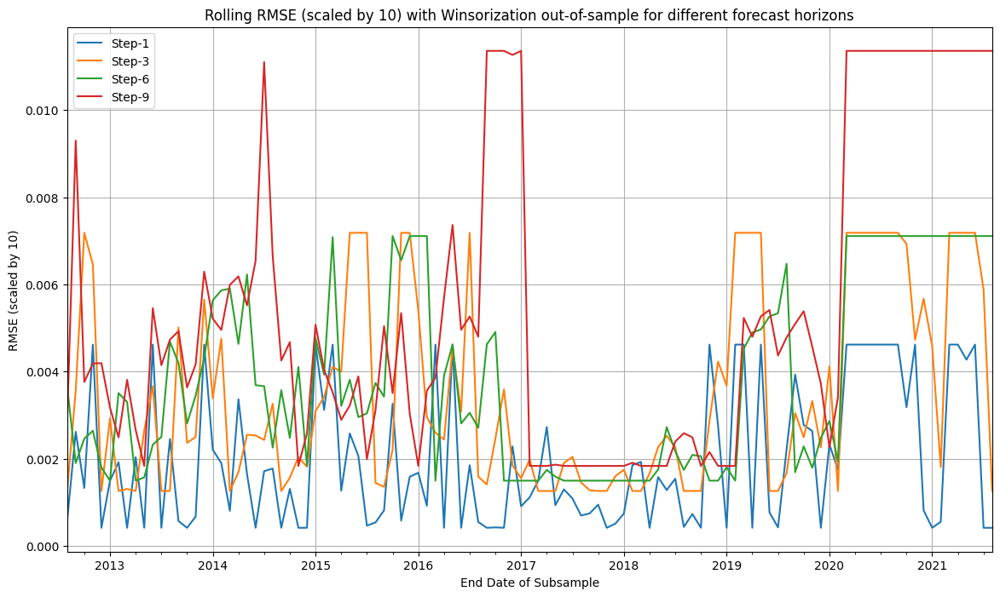

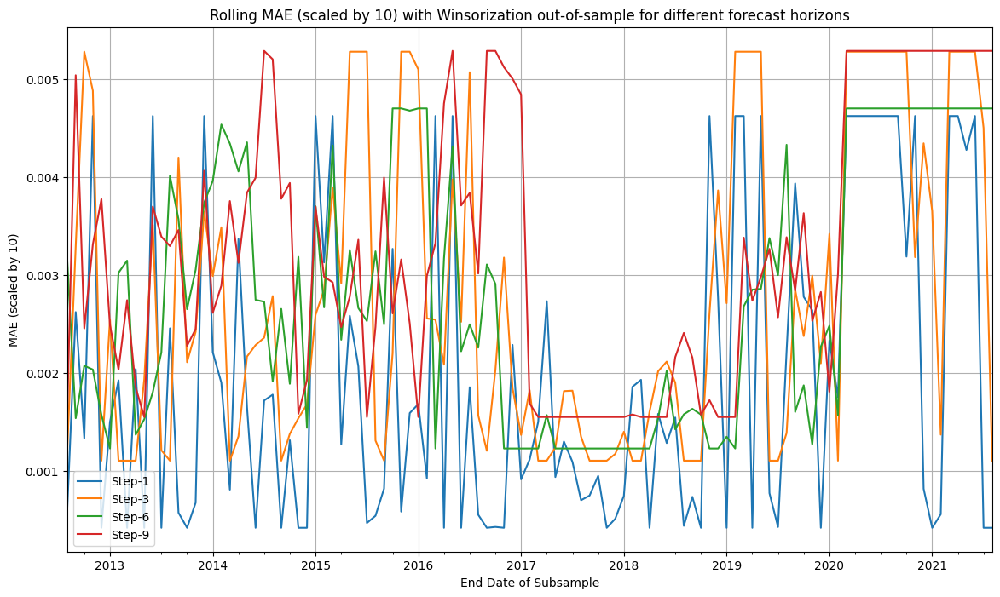

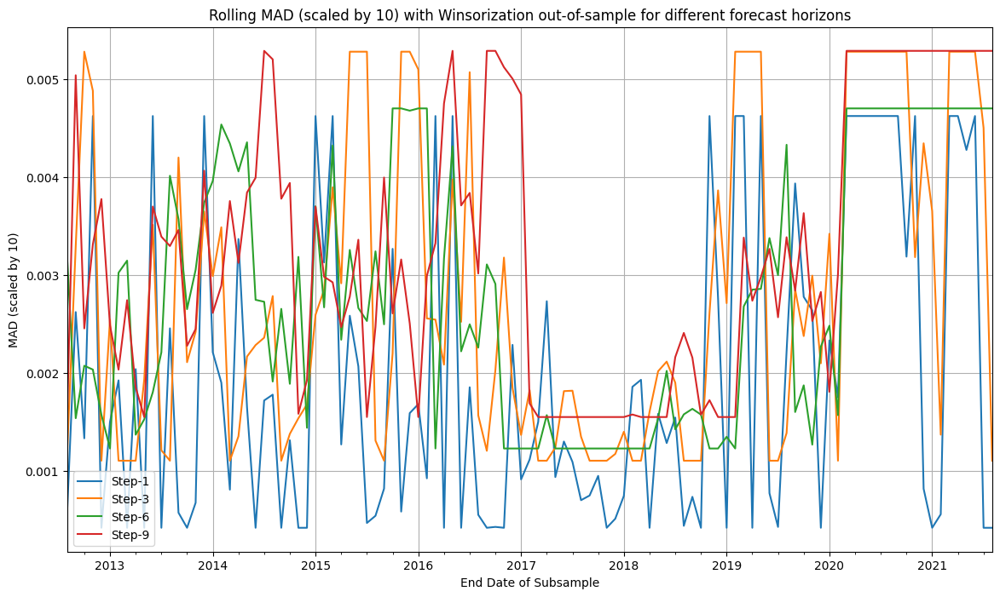

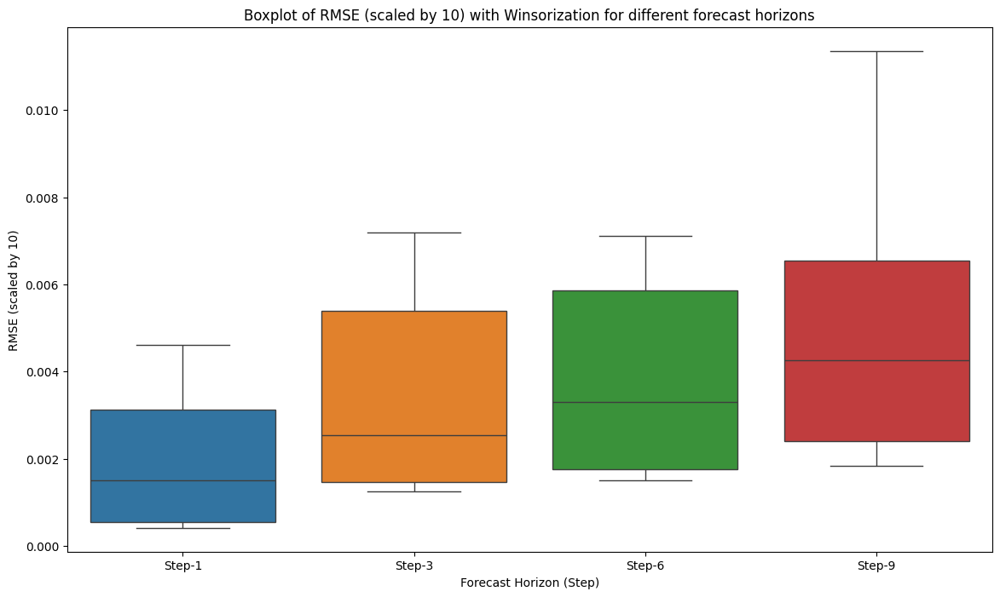

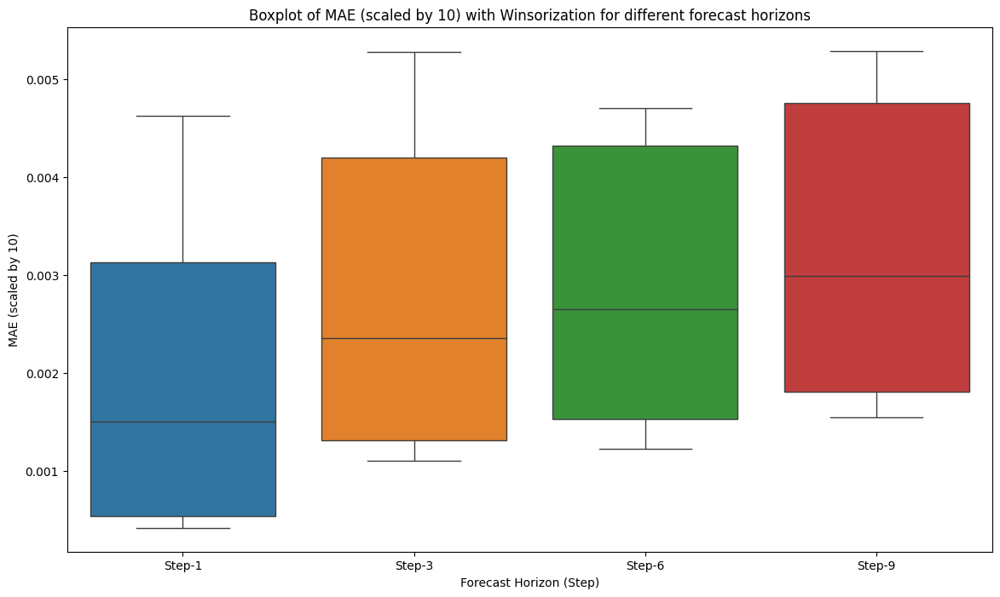

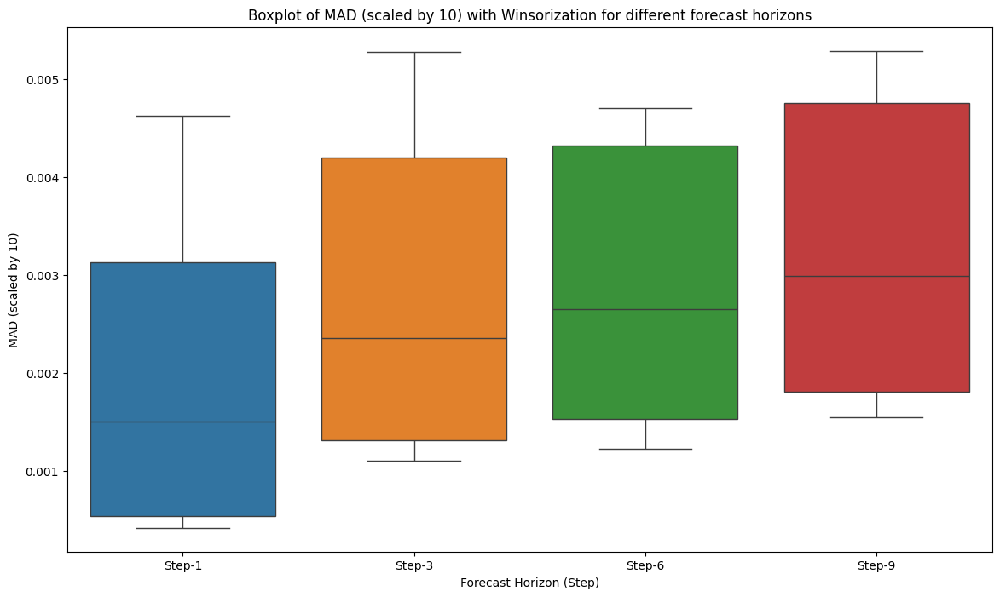

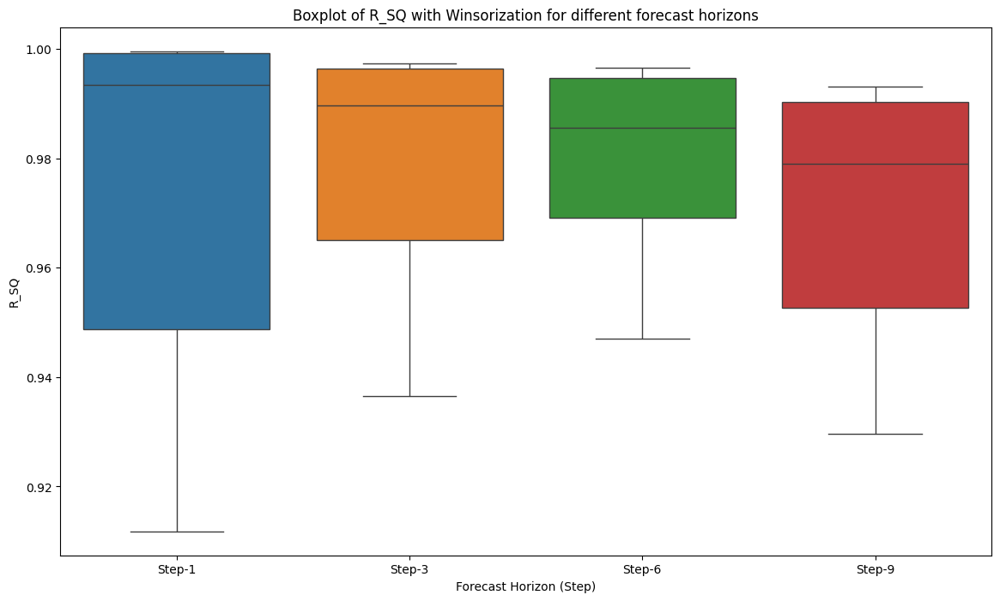

Updated code execution completed.


In [7]:
## catboost


import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from pypdc_sis import PDC_SIS  # Assuming this is the function you're using
from scipy.stats import mstats
import catboost as cb
### Part 1: Data Preparation

# Load the dataset
df = pd.read_csv('./official_data.csv')

# Extracting the GDP column as the target variable 'Y'
gdp = df['GDP']

# Extracting the predictors
data = df.iloc[:, 2:99]

# Creating lagged variables up to Lag 3
PredictLag3 = data.assign(**{
    f"{col}_lag{i}": data[col].shift(i) for i in range(1, 4) for col in data
}).reindex(columns=sorted(data.columns.tolist() + [f"{col}_lag{i}" for i in range(1, 4) for col in data], key=lambda x: (len(x), x)))

# Create a mask for non-NA rows
mask = PredictLag3.notna().all(axis=1)

# Apply the mask consistently to both X and Y
Xwl = PredictLag3[mask].to_numpy()
Y = gdp[mask].to_numpy()

print(f"Shape of Xwl: {Xwl.shape}, Shape of Y: {Y.shape}")

# Combine the date column with the predictors
dates = df['date'][mask].reset_index(drop=True)
Xwl_df = pd.DataFrame(Xwl, columns=PredictLag3.columns)
Xwl_df.insert(0, 'date', dates)

# Prepare the dataframe for rolling window analysis
df_combined = pd.concat([Xwl_df.reset_index(drop=True), pd.Series(Y, name='GDP')], axis=1)

# Function to train and fit RandomForest model with hyperparameter tuning using RandomizedSearchCV
def finetune_catboost(X_train, y_train):
    model = cb.CatBoostRegressor(silent=True)
    param_distributions = {
        'iterations': [100, 200, 300, 400, 500, 600, 1000],
        'depth': [2, 4, 6, 8, 10],
        'learning_rate': [0.01, 0.03, 0.05, 0.1, 0.2],
        'l2_leaf_reg': [1, 3, 5]
    }
    random_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_distributions,
        cv=3,
        scoring='neg_mean_squared_error',
        n_jobs=-1,
        n_iter=50,  # Adjust n_iter as needed
        random_state=42  # Ensures reproducibility
    )
    random_search.fit(X_train, y_train)
    return random_search.best_estimator_

# Function to calculate out-of-sample performance metrics
def OoS_metrics(y_true, y_pred, y_train_mean):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mad = np.mean(np.abs(y_true - y_pred))
    sse = np.sum((y_true - y_pred) ** 2)
    sst = np.sum((y_true - y_train_mean) ** 2)
    
    # Handle the case where SST is zero to avoid division by zero
    if sst == 0:
        r_sq = np.nan  # Or set to 0, depending on how you want to handle it
    else:
        r_sq = 1 - (sse / sst)
    return rmse, mae, mad, r_sq

# Function to calculate rolling-window OoS performance for 'tau'-steps ahead forecasts
def OoS_R_sq(df, tau, wsize, sstart, T1, ylag, sratio=0.80):
    """
    Calculate rolling-window out-of-sample performance for 'tau'-steps ahead forecasts.

    Parameters:
    df (DataFrame): DataFrame containing the date column and predictors.
    tau (int): Forecast horizon (number of steps ahead).
    wsize (int): Rolling window size.
    sstart (int): Start index for the subsample.
    T1 (int): Subsample size.
    ylag (int): Number of lags for the target variable.

    Returns:
    tuple: (rmse, mae, mad, r_sq, selected_features_current_window) performance metrics.
    """
    # Ensure the subsample size and indices are valid
    assert T1 > wsize + tau, "Size of subsample must be greater than window size plus tau!"
    assert sstart + T1 <= len(df), "End point of the last subsample must be <= size of the dataframe!"

    # Debugging: Print current start and end indices for the rolling window
    print(f"Rolling window: Start={sstart}, End={sstart + T1}, tau={tau}")

    # Extract the subsample from the dataframe
    df_sub = df.iloc[sstart:(sstart + T1), :].copy()

    # Correct the target label by shifting it backward by 'tau' steps to align features with future targets
    df_sub['target'] = df_sub['GDP'].shift(-tau)  # Corrected shift

    df_sub.dropna(inplace=True)  # Drop rows with NaN values caused by shifting

    # Debugging: Print the first few rows of the subsample to check alignment
    print(df_sub[['date', 'target']].head(5))

    # If ylag > 0, create lagged versions of the target variable
    if ylag > 0:
        for i in range(1, ylag + 1):
            df_sub[f'ylag{i}'] = df_sub['target'].shift(i)
        df_sub.dropna(inplace=True)

    # Extract the target variable and features
    feature_columns = df_sub.columns[1:-1]  # Exclude 'date', 'GDP', and 'target'
    R = np.array(df_sub['target'], dtype='float64')
    X = df_sub[feature_columns].to_numpy(dtype='float64')

    # Splitting data into train, validation, and test sets
    T = X.shape[0]
    validation_size = 16  # Fixed validation size
    test_size = tau  # Set test size to forecast horizon
    train_size = T - validation_size - test_size

    if train_size <= 0:
        raise ValueError("Training size is non-positive. Adjust T1 or sstart.")

    # Split the data
    X_train = X[:train_size]
    y_train = R[:train_size]

    X_valid = X[train_size:train_size + validation_size]
    y_valid = R[train_size:train_size + validation_size]

    X_test = X[train_size + validation_size:train_size + validation_size + test_size]
    y_test = R[train_size + validation_size:train_size + validation_size + test_size]

    if len(y_test) < test_size:
        raise ValueError("Not enough data for the test set. Adjust T1 or sstart.")

    # Debugging: Print the sizes of the splits
    print(f"Train size: {X_train.shape[0]}, Validation size: {X_valid.shape[0]}, Test size: {X_test.shape[0]}")

    # Apply PDC-SIS on X_train and y_train to select top 8 features
    top_n_pdc_sis = min(8, X_train.shape[1])  # Select top 8 features or fewer if less features are available
    results = PDC_SIS(X_train, y_train, lags=3, top_n=top_n_pdc_sis)

    # Check if 'indices' is in results
    if 'indices' not in results or results['indices'] is None:
        raise ValueError("PDC_SIS did not return any feature indices.")

    # Retrieve indices of top 8 features
    selected_indices = results['indices']
    selected_feature_names = feature_columns[selected_indices]

    # Keep track of selected features
    selected_features_current_window = selected_feature_names.tolist()

    # Transform X_train, X_valid, X_test to have only selected features
    X_train_selected = X_train[:, selected_indices]
    X_valid_selected = X_valid[:, selected_indices]
    X_test_selected = X_test[:, selected_indices]

    # Train the model with hyperparameter tuning using RandomizedSearchCV
    model = finetune_catboost(X_train_selected, y_train)

    # Predict on the test set
    y_pred = model.predict(X_test_selected)

    # Compute the mean of the training target values (baseline forecast)
    y_train_mean = np.mean(y_train)

    # Calculate out-of-sample performance metrics using the correct R-squared formula
    rmse, mae, mad, r_sq = OoS_metrics(y_test, y_pred, y_train_mean)

    # After making predictions, store actual and predicted values along with dates
    test_dates = df_sub.iloc[train_size + validation_size:train_size + validation_size + test_size]['date']
    forecast_results = pd.DataFrame({
        'date': test_dates,
        'actual': y_test,
        'predicted': y_pred,
        'sstart': sstart,
        'window_end': df.iloc[sstart + T1 - 1]['date']
    })
    
    # Calculate metrics
    rmse, mae, mad, r_sq = OoS_metrics(y_test, y_pred, y_train_mean)
    
    return rmse, mae, mad, r_sq, selected_features_current_window, forecast_results

def OoS_R_sq_many_ssamples(df, tau, step_size, wsize, T1, ylag, sratio=0.80):
    ssize = len(df) - ylag
    perf_dict = {
        'sstart': [], 'ssample_end_date': [], 
        'rmse': [], 'mae': [], 'mad': [], 'r_sq': [], 
        'selected_features': []
    }
    
    # Add this line to store all forecasts
    all_forecasts = []
    
    for sstart in range(0, ssize + step_size, step_size):
        if sstart + T1 <= ssize:
            try:
                # Update function call to include forecast_results
                rmse, mae, mad, r_sq, selected_features, forecast_results = OoS_R_sq(
                    df, tau, wsize, sstart, T1, ylag, sratio
                )
                perf_dict['sstart'].append(sstart)
                perf_dict['ssample_end_date'].append(df.iloc[sstart + T1 - 1]['date'])
                perf_dict['rmse'].append(rmse)
                perf_dict['mae'].append(mae)
                perf_dict['mad'].append(mad)
                perf_dict['r_sq'].append(r_sq)
                perf_dict['selected_features'].append(selected_features)
                
                # Add this line to collect forecast results
                all_forecasts.append(forecast_results)
                
            except Exception as e:
                print(f"An error occurred at sstart={sstart}: {e}")
    
    # Add this section to combine and return forecasts
    if all_forecasts:
        combined_forecasts = pd.concat(all_forecasts, ignore_index=True)
        return perf_dict, combined_forecasts
    return perf_dict, None 


# Define parameters
wsize = 75  # Rolling window size
T1 = 100    # Subsample size
step_size = 1
ylag = 1

# Create a directory to save results
output_dir = './OoS_metrics_Catboost_off'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Step 2: Calculate performance for different forecast horizons (tau) and save the results
taus = [1, 3, 6, 9]
results = {}

for tau in taus:
    print(f"\nProcessing tau={tau}")
    result, forecasts = OoS_R_sq_many_ssamples(
        df_combined, tau=tau, step_size=step_size, 
        wsize=wsize, T1=T1, ylag=ylag
    )
    results[tau] = result
    
    # Save the regular metrics
    result_df = pd.DataFrame(result)
    result_df.to_csv(os.path.join(output_dir, f'OoS_metrics_tau_{tau}.csv'), index=False)
    
    # Save actual vs predicted values
    if forecasts is not None:
        forecasts_filename = os.path.join(output_dir, f'actual_vs_predicted_tau_{tau}.csv')
        forecasts.to_csv(forecasts_filename, index=False)


#### Winsorization ###########################################################################################################

def winsorize_data(data, limits=(0.20, 0.20)):
    # Apply Winsorization with given limits
    if len(data) == 0:
        return np.array([])
    return mstats.winsorize(data, limits=limits)

def winsorize_data_2(data, limits=(0.20, 0.20)):
    # Apply Winsorization with given limits
    if len(data) == 0:
        return np.array([])
    return mstats.winsorize(data, limits=limits)

# Step 3: Plot the rolling RMSE for each tau with Winsorization applied
plt.figure(figsize=(14, 8))
for tau, result in results.items():
    if result['rmse']:
        # Apply Winsorization to reduce the effect of outliers
        rmse_series = pd.Series(winsorize_data(np.array(result['rmse'])), index=pd.to_datetime(result['ssample_end_date'])) * 10  # Scale by 10
        rmse_series.plot(label=f'Step-{tau}')
    else:
        print(f"No RMSE data to plot for tau={tau}")

plt.title('Rolling RMSE (scaled by 10) with Winsorization out-of-sample for different forecast horizons')
plt.xlabel('End Date of Subsample')
plt.ylabel('RMSE (scaled by 10)')
plt.legend()
plt.grid(True)
plt.show()

# Rolling line chart for MAE
plt.figure(figsize=(14, 8))
for tau, result in results.items():
    if result['mae']:
        # Apply Winsorization to reduce the effect of outliers
        mae_series = pd.Series(winsorize_data(np.array(result['mae'])), index=pd.to_datetime(result['ssample_end_date'])) * 10  # Scale by 10
        mae_series.plot(label=f'Step-{tau}')
    else:
        print(f"No MAE data to plot for tau={tau}")

plt.title('Rolling MAE (scaled by 10) with Winsorization out-of-sample for different forecast horizons')
plt.xlabel('End Date of Subsample')
plt.ylabel('MAE (scaled by 10)')
plt.legend()
plt.grid(True)
plt.show()

# Rolling line chart for MAD
plt.figure(figsize=(14, 8))
for tau, result in results.items():
    if result['mad']:
        # Apply Winsorization to reduce the effect of outliers
        mad_series = pd.Series(winsorize_data(np.array(result['mad'])), index=pd.to_datetime(result['ssample_end_date'])) * 10  # Scale by 10
        mad_series.plot(label=f'Step-{tau}')
    else:
        print(f"No MAD data to plot for tau={tau}")

plt.title('Rolling MAD (scaled by 10) with Winsorization out-of-sample for different forecast horizons')
plt.xlabel('End Date of Subsample')
plt.ylabel('MAD (scaled by 10)')
plt.legend()
plt.grid(True)
plt.show()

# Step 4: Create box plots for all metrics, scaled by 10, with outlier handling
for metric in ['rmse', 'mae', 'mad']:
    plt.figure(figsize=(14, 8))
    data_to_plot = []
    for tau in taus:
        result = results[tau]
        if result[metric]:
            # Apply Winsorization to reduce the effect of outliers
            data = winsorize_data(np.array(result[metric]) * 10)
            data_to_plot.append(data)
        else:
            data_to_plot.append(np.array([]))
            print(f"No {metric.upper()} data for tau={tau}")

    sns.boxplot(data=data_to_plot)
    plt.title(f'Boxplot of {metric.upper()} (scaled by 10) with Winsorization for different forecast horizons')
    plt.xlabel('Forecast Horizon (Step)')
    plt.ylabel(f'{metric.upper()} (scaled by 10)')
    plt.xticks(ticks=range(len(taus)), labels=[f'Step-{tau}' for tau in taus])
    plt.show()

# Box plot for R-squared
for metric in ['r_sq']:
    plt.figure(figsize=(14, 8))
    data_to_plot = []
    for tau in taus:
        result = results[tau]
        if result[metric]:
            # Apply Winsorization using the new function to reduce the effect of outliers
            data = winsorize_data_2(np.array(result[metric]))
            data_to_plot.append(data)
        else:
            data_to_plot.append(np.array([]))
            print(f"No {metric.upper()} data for tau={tau}")

    sns.boxplot(data=data_to_plot)
    plt.title(f'Boxplot of {metric.upper()} with Winsorization for different forecast horizons')
    plt.xlabel('Forecast Horizon (Step)')
    plt.ylabel(f'{metric.upper()}')
    plt.xticks(ticks=range(len(taus)), labels=[f'Step-{tau}' for tau in taus])
    plt.show()

# Create directories to save metrics
output_dir_non_winsor = './OoS_metrics_Catboost_off/non_winsorized'
output_dir_winsor = './OoS_metrics_Catboost_off/winsorized'
os.makedirs(output_dir_non_winsor, exist_ok=True)
os.makedirs(output_dir_winsor, exist_ok=True)

# Step 5: Save non-winsorized and winsorized metrics
for tau in taus:
    result = results[tau]
    # Save the results to CSV for non-winsorized data
    result_df = pd.DataFrame(result)
    result_df.to_csv(os.path.join(output_dir_non_winsor, f'OoS_metrics_tau_{tau}_non_winsorized.csv'), index=False)

    # Apply Winsorization to reduce the effect of outliers and save adjusted metrics
    winsorized_result = {
        'sstart': result['sstart'],
        'ssample_end_date': result['ssample_end_date'],
        'rmse': winsorize_data(np.array(result['rmse'])).tolist() if result['rmse'] else [],
        'mae': winsorize_data(np.array(result['mae'])).tolist() if result['mae'] else [],
        'mad': winsorize_data(np.array(result['mad'])).tolist() if result['mad'] else [],
        'r_sq': winsorize_data_2(np.array(result['r_sq'])).tolist() if result['r_sq'] else [],
        'selected_features': result['selected_features']
    }
    winsorized_df = pd.DataFrame(winsorized_result)
    winsorized_df.to_csv(os.path.join(output_dir_winsor, f'OoS_metrics_tau_{tau}_winsorized.csv'), index=False)

    selected_features_df = pd.DataFrame({
        'sstart': result['sstart'],
        'ssample_end_date': result['ssample_end_date'],
        'selected_features': [', '.join(features) for features in result['selected_features']]
    })
    selected_features_filename = os.path.join(
        output_dir,
        f'selected_features_tau_{tau}.csv'
    )
    selected_features_df.to_csv(selected_features_filename, index=False)

print("Updated code execution completed.")


C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\110913398.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  PredictLag3 = data.assign(**{
C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\110913398.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  PredictLag3 = data.assign(**{
C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\110913398.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.

Shape of Xwl: (209, 388), Shape of Y: (209,)

Processing tau=1
Rolling window: Start=0, End=100, tau=1
         date    target
0  2004-05-01  0.004531
1  2004-06-01  0.000698
2  2004-07-01  0.004559
3  2004-08-01  0.002773
4  2004-09-01  0.001207
Train size: 81, Validation size: 16, Test size: 1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 218
[LightGBM] [Info] Number of data points in the train set: 81, number of used features: 8
[LightGBM] [Info] Start training from score 0.001322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with

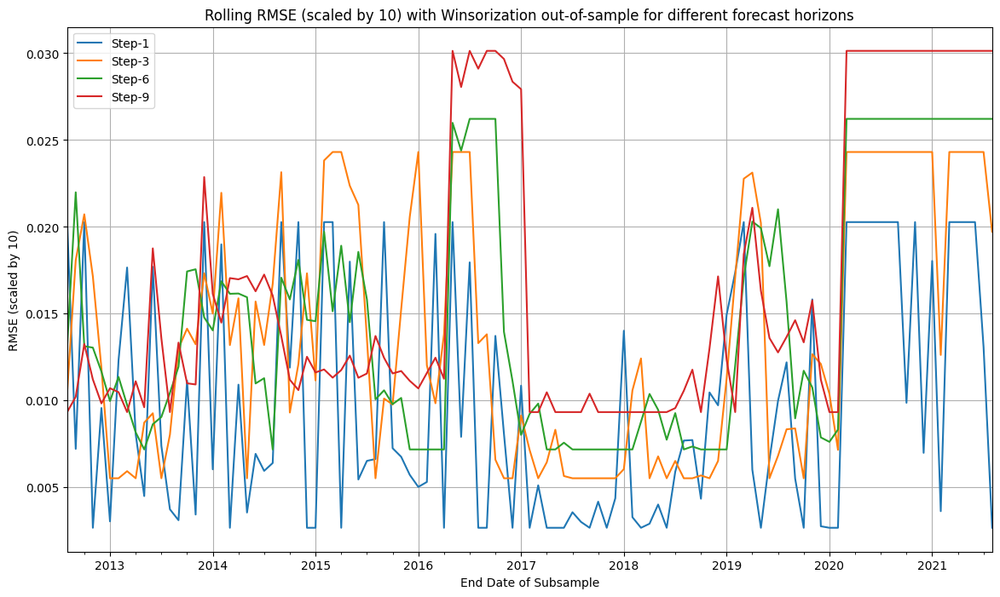

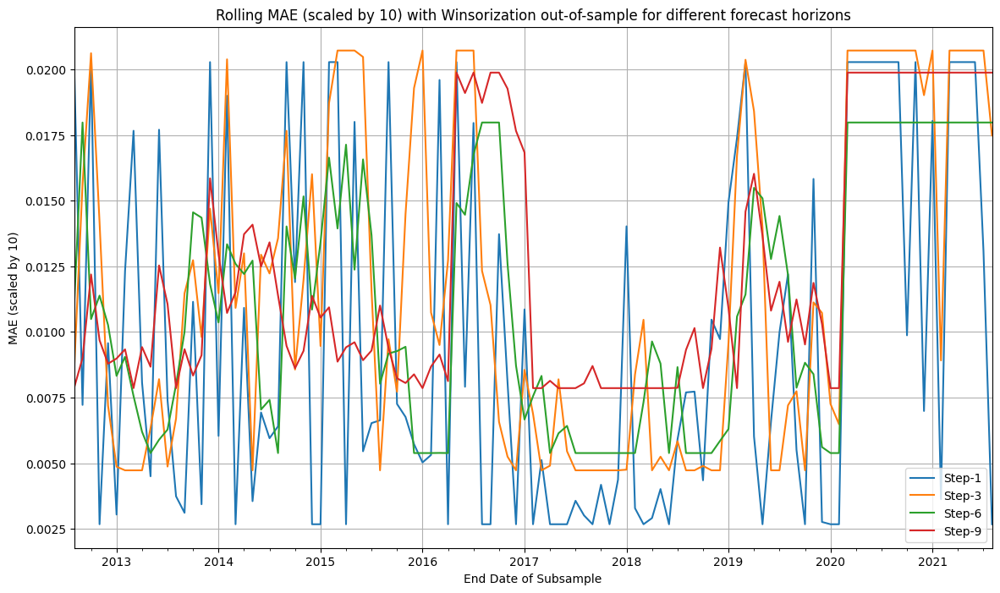

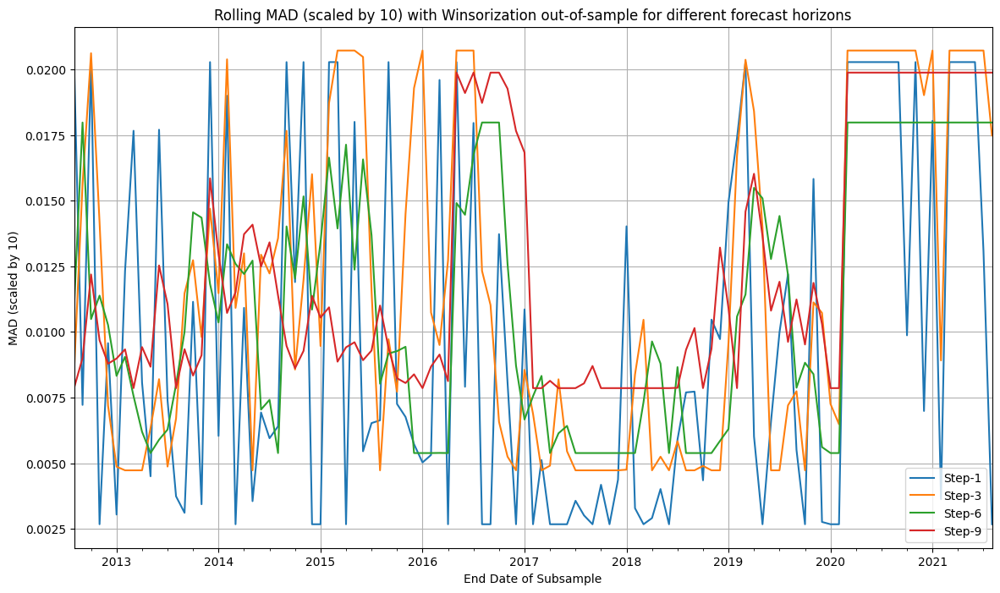

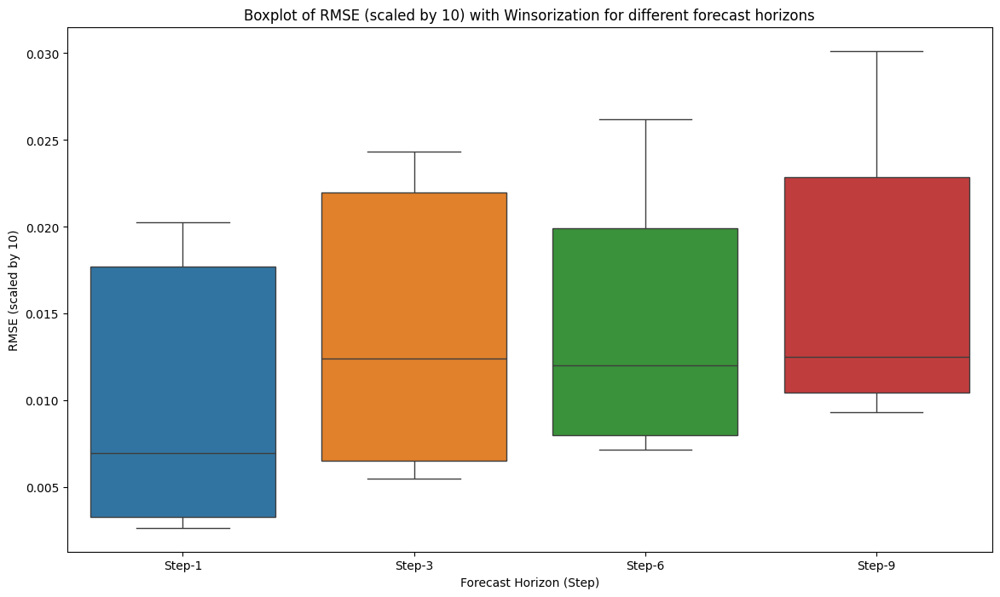

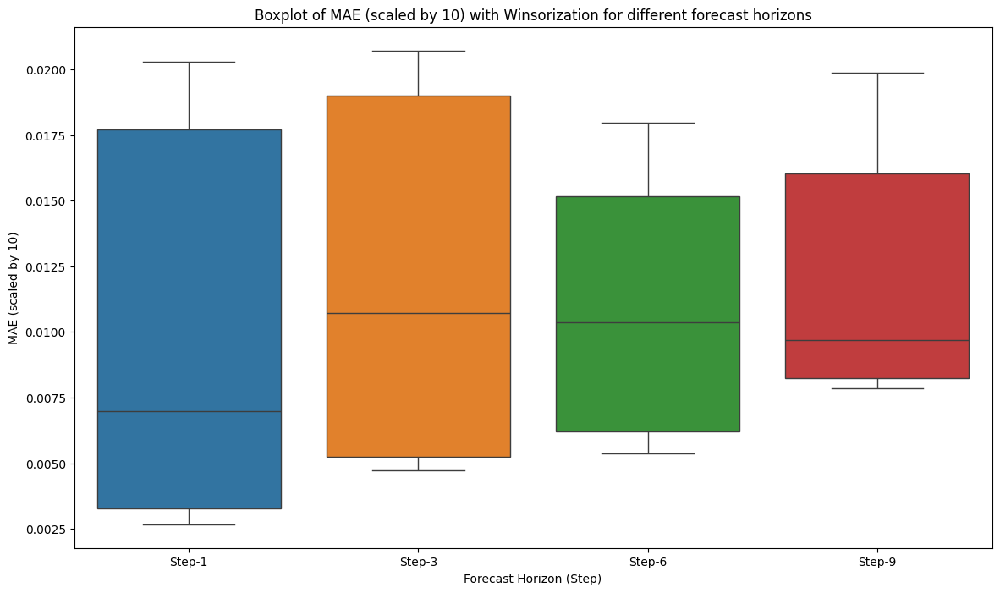

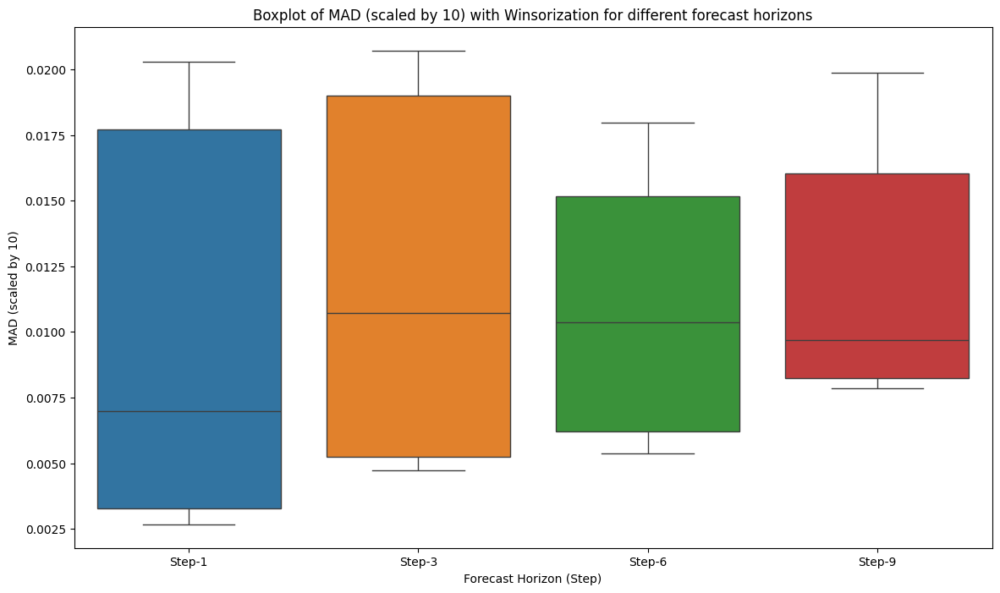

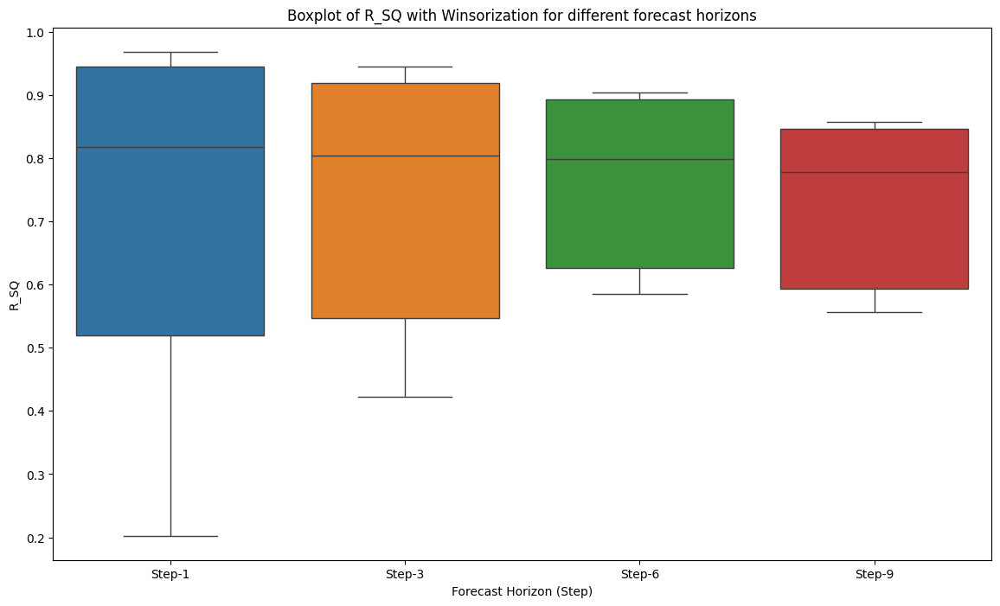

Updated code execution completed.


In [8]:
### LightGBM


import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from pypdc_sis import PDC_SIS  # Assuming this is the function you're using
from scipy.stats import mstats
import lightgbm as lgb
### Part 1: Data Preparation

# Load the dataset
df = pd.read_csv('./official_data.csv')

# Extracting the GDP column as the target variable 'Y'
gdp = df['GDP']

# Extracting the predictors
data = df.iloc[:, 2:99]

# Creating lagged variables up to Lag 3
PredictLag3 = data.assign(**{
    f"{col}_lag{i}": data[col].shift(i) for i in range(1, 4) for col in data
}).reindex(columns=sorted(data.columns.tolist() + [f"{col}_lag{i}" for i in range(1, 4) for col in data], key=lambda x: (len(x), x)))

# Create a mask for non-NA rows
mask = PredictLag3.notna().all(axis=1)

# Apply the mask consistently to both X and Y
Xwl = PredictLag3[mask].to_numpy()
Y = gdp[mask].to_numpy()

print(f"Shape of Xwl: {Xwl.shape}, Shape of Y: {Y.shape}")

# Combine the date column with the predictors
dates = df['date'][mask].reset_index(drop=True)
Xwl_df = pd.DataFrame(Xwl, columns=PredictLag3.columns)
Xwl_df.insert(0, 'date', dates)

# Prepare the dataframe for rolling window analysis
df_combined = pd.concat([Xwl_df.reset_index(drop=True), pd.Series(Y, name='GDP')], axis=1)

# Function to train and fit RandomForest model with hyperparameter tuning using RandomizedSearchCV
def finetune_lightgbm(X_train, y_train):
    model = lgb.LGBMRegressor()
    param_distributions = {
        'n_estimators': [100, 200, 300, 500, 600, 1000],
        'max_depth': [1, 3, 5, 7, 8, 10],
        'learning_rate': [0.01, 0.03, 0.05, 0.1, 0.2],
        'num_leaves': [20, 31, 40],
        'feature_fraction': [0.5, 0.6, 0.7, 0.8, 1.0]
    }
    random_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_distributions,
        cv=3,
        scoring='neg_mean_squared_error',
        n_jobs=-1,
        n_iter=50,  # Adjust n_iter based on your needs
        random_state=42  # Ensures reproducibility
    )
    random_search.fit(X_train, y_train)
    return random_search.best_estimator_

# Function to calculate out-of-sample performance metrics
def OoS_metrics(y_true, y_pred, y_train_mean):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mad = np.mean(np.abs(y_true - y_pred))
    sse = np.sum((y_true - y_pred) ** 2)
    sst = np.sum((y_true - y_train_mean) ** 2)
    
    # Handle the case where SST is zero to avoid division by zero
    if sst == 0:
        r_sq = np.nan  # Or set to 0, depending on how you want to handle it
    else:
        r_sq = 1 - (sse / sst)
    return rmse, mae, mad, r_sq

# Function to calculate rolling-window OoS performance for 'tau'-steps ahead forecasts
def OoS_R_sq(df, tau, wsize, sstart, T1, ylag, sratio=0.80):
    """
    Calculate rolling-window out-of-sample performance for 'tau'-steps ahead forecasts.

    Parameters:
    df (DataFrame): DataFrame containing the date column and predictors.
    tau (int): Forecast horizon (number of steps ahead).
    wsize (int): Rolling window size.
    sstart (int): Start index for the subsample.
    T1 (int): Subsample size.
    ylag (int): Number of lags for the target variable.

    Returns:
    tuple: (rmse, mae, mad, r_sq, selected_features_current_window) performance metrics.
    """
    # Ensure the subsample size and indices are valid
    assert T1 > wsize + tau, "Size of subsample must be greater than window size plus tau!"
    assert sstart + T1 <= len(df), "End point of the last subsample must be <= size of the dataframe!"

    # Debugging: Print current start and end indices for the rolling window
    print(f"Rolling window: Start={sstart}, End={sstart + T1}, tau={tau}")

    # Extract the subsample from the dataframe
    df_sub = df.iloc[sstart:(sstart + T1), :].copy()

    # Correct the target label by shifting it backward by 'tau' steps to align features with future targets
    df_sub['target'] = df_sub['GDP'].shift(-tau)  # Corrected shift

    df_sub.dropna(inplace=True)  # Drop rows with NaN values caused by shifting

    # Debugging: Print the first few rows of the subsample to check alignment
    print(df_sub[['date', 'target']].head(5))

    # If ylag > 0, create lagged versions of the target variable
    if ylag > 0:
        for i in range(1, ylag + 1):
            df_sub[f'ylag{i}'] = df_sub['target'].shift(i)
        df_sub.dropna(inplace=True)

    # Extract the target variable and features
    feature_columns = df_sub.columns[1:-1]  # Exclude 'date', 'GDP', and 'target'
    R = np.array(df_sub['target'], dtype='float64')
    X = df_sub[feature_columns].to_numpy(dtype='float64')

    # Splitting data into train, validation, and test sets
    T = X.shape[0]
    validation_size = 16  # Fixed validation size
    test_size = tau  # Set test size to forecast horizon
    train_size = T - validation_size - test_size

    if train_size <= 0:
        raise ValueError("Training size is non-positive. Adjust T1 or sstart.")

    # Split the data
    X_train = X[:train_size]
    y_train = R[:train_size]

    X_valid = X[train_size:train_size + validation_size]
    y_valid = R[train_size:train_size + validation_size]

    X_test = X[train_size + validation_size:train_size + validation_size + test_size]
    y_test = R[train_size + validation_size:train_size + validation_size + test_size]

    if len(y_test) < test_size:
        raise ValueError("Not enough data for the test set. Adjust T1 or sstart.")

    # Debugging: Print the sizes of the splits
    print(f"Train size: {X_train.shape[0]}, Validation size: {X_valid.shape[0]}, Test size: {X_test.shape[0]}")

    # Apply PDC-SIS on X_train and y_train to select top 8 features
    top_n_pdc_sis = min(8, X_train.shape[1])  # Select top 8 features or fewer if less features are available
    results = PDC_SIS(X_train, y_train, lags=3, top_n=top_n_pdc_sis)

    # Check if 'indices' is in results
    if 'indices' not in results or results['indices'] is None:
        raise ValueError("PDC_SIS did not return any feature indices.")

    # Retrieve indices of top 8 features
    selected_indices = results['indices']
    selected_feature_names = feature_columns[selected_indices]

    # Keep track of selected features
    selected_features_current_window = selected_feature_names.tolist()

    # Transform X_train, X_valid, X_test to have only selected features
    X_train_selected = X_train[:, selected_indices]
    X_valid_selected = X_valid[:, selected_indices]
    X_test_selected = X_test[:, selected_indices]

    # Train the model with hyperparameter tuning using RandomizedSearchCV
    model = finetune_lightgbm(X_train_selected, y_train)

    # Predict on the test set
    y_pred = model.predict(X_test_selected)

    # Compute the mean of the training target values (baseline forecast)
    y_train_mean = np.mean(y_train)

    # Calculate out-of-sample performance metrics using the correct R-squared formula
    rmse, mae, mad, r_sq = OoS_metrics(y_test, y_pred, y_train_mean)

    # After making predictions, store actual and predicted values along with dates
    test_dates = df_sub.iloc[train_size + validation_size:train_size + validation_size + test_size]['date']
    forecast_results = pd.DataFrame({
        'date': test_dates,
        'actual': y_test,
        'predicted': y_pred,
        'sstart': sstart,
        'window_end': df.iloc[sstart + T1 - 1]['date']
    })
    
    # Calculate metrics
    rmse, mae, mad, r_sq = OoS_metrics(y_test, y_pred, y_train_mean)
    
    return rmse, mae, mad, r_sq, selected_features_current_window, forecast_results

def OoS_R_sq_many_ssamples(df, tau, step_size, wsize, T1, ylag, sratio=0.80):
    ssize = len(df) - ylag
    perf_dict = {
        'sstart': [], 'ssample_end_date': [], 
        'rmse': [], 'mae': [], 'mad': [], 'r_sq': [], 
        'selected_features': []
    }
    
    # Add this line to store all forecasts
    all_forecasts = []
    
    for sstart in range(0, ssize + step_size, step_size):
        if sstart + T1 <= ssize:
            try:
                # Update function call to include forecast_results
                rmse, mae, mad, r_sq, selected_features, forecast_results = OoS_R_sq(
                    df, tau, wsize, sstart, T1, ylag, sratio
                )
                perf_dict['sstart'].append(sstart)
                perf_dict['ssample_end_date'].append(df.iloc[sstart + T1 - 1]['date'])
                perf_dict['rmse'].append(rmse)
                perf_dict['mae'].append(mae)
                perf_dict['mad'].append(mad)
                perf_dict['r_sq'].append(r_sq)
                perf_dict['selected_features'].append(selected_features)
                
                # Add this line to collect forecast results
                all_forecasts.append(forecast_results)
                
            except Exception as e:
                print(f"An error occurred at sstart={sstart}: {e}")
    
    # Add this section to combine and return forecasts
    if all_forecasts:
        combined_forecasts = pd.concat(all_forecasts, ignore_index=True)
        return perf_dict, combined_forecasts
    return perf_dict, None 


# Define parameters
wsize = 75  # Rolling window size
T1 = 100    # Subsample size
step_size = 1
ylag = 1

# Create a directory to save results
output_dir = './OoS_metrics_LightGBM_off'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Step 2: Calculate performance for different forecast horizons (tau) and save the results
taus = [1, 3, 6, 9]
results = {}


for tau in taus:
    print(f"\nProcessing tau={tau}")
    result, forecasts = OoS_R_sq_many_ssamples(
        df_combined, tau=tau, step_size=step_size, 
        wsize=wsize, T1=T1, ylag=ylag
    )
    results[tau] = result
    
    # Save the regular metrics
    result_df = pd.DataFrame(result)
    result_df.to_csv(os.path.join(output_dir, f'OoS_metrics_tau_{tau}.csv'), index=False)
    
    # Save actual vs predicted values
    if forecasts is not None:
        forecasts_filename = os.path.join(output_dir, f'actual_vs_predicted_tau_{tau}.csv')
        forecasts.to_csv(forecasts_filename, index=False)


#### Winsorization ###########################################################################################################

def winsorize_data(data, limits=(0.20, 0.20)):
    # Apply Winsorization with given limits
    if len(data) == 0:
        return np.array([])
    return mstats.winsorize(data, limits=limits)

def winsorize_data_2(data, limits=(0.20, 0.20)):
    # Apply Winsorization with given limits
    if len(data) == 0:
        return np.array([])
    return mstats.winsorize(data, limits=limits)

# Step 3: Plot the rolling RMSE for each tau with Winsorization applied
plt.figure(figsize=(14, 8))
for tau, result in results.items():
    if result['rmse']:
        # Apply Winsorization to reduce the effect of outliers
        rmse_series = pd.Series(winsorize_data(np.array(result['rmse'])), index=pd.to_datetime(result['ssample_end_date'])) * 10  # Scale by 10
        rmse_series.plot(label=f'Step-{tau}')
    else:
        print(f"No RMSE data to plot for tau={tau}")

plt.title('Rolling RMSE (scaled by 10) with Winsorization out-of-sample for different forecast horizons')
plt.xlabel('End Date of Subsample')
plt.ylabel('RMSE (scaled by 10)')
plt.legend()
plt.grid(True)
plt.show()

# Rolling line chart for MAE
plt.figure(figsize=(14, 8))
for tau, result in results.items():
    if result['mae']:
        # Apply Winsorization to reduce the effect of outliers
        mae_series = pd.Series(winsorize_data(np.array(result['mae'])), index=pd.to_datetime(result['ssample_end_date'])) * 10  # Scale by 10
        mae_series.plot(label=f'Step-{tau}')
    else:
        print(f"No MAE data to plot for tau={tau}")

plt.title('Rolling MAE (scaled by 10) with Winsorization out-of-sample for different forecast horizons')
plt.xlabel('End Date of Subsample')
plt.ylabel('MAE (scaled by 10)')
plt.legend()
plt.grid(True)
plt.show()

# Rolling line chart for MAD
plt.figure(figsize=(14, 8))
for tau, result in results.items():
    if result['mad']:
        # Apply Winsorization to reduce the effect of outliers
        mad_series = pd.Series(winsorize_data(np.array(result['mad'])), index=pd.to_datetime(result['ssample_end_date'])) * 10  # Scale by 10
        mad_series.plot(label=f'Step-{tau}')
    else:
        print(f"No MAD data to plot for tau={tau}")

plt.title('Rolling MAD (scaled by 10) with Winsorization out-of-sample for different forecast horizons')
plt.xlabel('End Date of Subsample')
plt.ylabel('MAD (scaled by 10)')
plt.legend()
plt.grid(True)
plt.show()

# Step 4: Create box plots for all metrics, scaled by 10, with outlier handling
for metric in ['rmse', 'mae', 'mad']:
    plt.figure(figsize=(14, 8))
    data_to_plot = []
    for tau in taus:
        result = results[tau]
        if result[metric]:
            # Apply Winsorization to reduce the effect of outliers
            data = winsorize_data(np.array(result[metric]) * 10)
            data_to_plot.append(data)
        else:
            data_to_plot.append(np.array([]))
            print(f"No {metric.upper()} data for tau={tau}")

    sns.boxplot(data=data_to_plot)
    plt.title(f'Boxplot of {metric.upper()} (scaled by 10) with Winsorization for different forecast horizons')
    plt.xlabel('Forecast Horizon (Step)')
    plt.ylabel(f'{metric.upper()} (scaled by 10)')
    plt.xticks(ticks=range(len(taus)), labels=[f'Step-{tau}' for tau in taus])
    plt.show()

# Box plot for R-squared
for metric in ['r_sq']:
    plt.figure(figsize=(14, 8))
    data_to_plot = []
    for tau in taus:
        result = results[tau]
        if result[metric]:
            # Apply Winsorization using the new function to reduce the effect of outliers
            data = winsorize_data_2(np.array(result[metric]))
            data_to_plot.append(data)
        else:
            data_to_plot.append(np.array([]))
            print(f"No {metric.upper()} data for tau={tau}")

    sns.boxplot(data=data_to_plot)
    plt.title(f'Boxplot of {metric.upper()} with Winsorization for different forecast horizons')
    plt.xlabel('Forecast Horizon (Step)')
    plt.ylabel(f'{metric.upper()}')
    plt.xticks(ticks=range(len(taus)), labels=[f'Step-{tau}' for tau in taus])
    plt.show()

# Create directories to save metrics
output_dir_non_winsor = './OoS_metrics_LightGBM_off/non_winsorized'
output_dir_winsor = './OoS_metrics_LightGBM_off/winsorized'
os.makedirs(output_dir_non_winsor, exist_ok=True)
os.makedirs(output_dir_winsor, exist_ok=True)

# Step 5: Save non-winsorized and winsorized metrics
for tau in taus:
    result = results[tau]
    # Save the results to CSV for non-winsorized data
    result_df = pd.DataFrame(result)
    result_df.to_csv(os.path.join(output_dir_non_winsor, f'OoS_metrics_tau_{tau}_non_winsorized.csv'), index=False)

    # Apply Winsorization to reduce the effect of outliers and save adjusted metrics
    winsorized_result = {
        'sstart': result['sstart'],
        'ssample_end_date': result['ssample_end_date'],
        'rmse': winsorize_data(np.array(result['rmse'])).tolist() if result['rmse'] else [],
        'mae': winsorize_data(np.array(result['mae'])).tolist() if result['mae'] else [],
        'mad': winsorize_data(np.array(result['mad'])).tolist() if result['mad'] else [],
        'r_sq': winsorize_data_2(np.array(result['r_sq'])).tolist() if result['r_sq'] else [],
        'selected_features': result['selected_features']
    }
    winsorized_df = pd.DataFrame(winsorized_result)
    winsorized_df.to_csv(os.path.join(output_dir_winsor, f'OoS_metrics_tau_{tau}_winsorized.csv'), index=False)

    selected_features_df = pd.DataFrame({
        'sstart': result['sstart'],
        'ssample_end_date': result['ssample_end_date'],
        'selected_features': [', '.join(features) for features in result['selected_features']]
    })
    selected_features_filename = os.path.join(
        output_dir,
        f'selected_features_tau_{tau}.csv'
    )
    selected_features_df.to_csv(selected_features_filename, index=False)

print("Updated code execution completed.")


C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\2171683698.py:26: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  PredictLag3 = data.assign(**{
C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\2171683698.py:26: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  PredictLag3 = data.assign(**{
C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\2171683698.py:26: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performan

Shape of Xwl: (209, 388), Shape of Y: (209,)

Processing tau=1
Rolling window: Start=0, End=100, tau=1
         date    target
0  2004-05-01  0.004531
1  2004-06-01  0.000698
2  2004-07-01  0.004559
3  2004-08-01  0.002773
4  2004-09-01  0.001207
Train size: 81, Validation size: 16, Test size: 1
An error occurred at sstart=0: cannot unpack non-iterable NoneType object
Rolling window: Start=1, End=101, tau=1
         date    target
1  2004-06-01  0.000698
2  2004-07-01  0.004559
3  2004-08-01  0.002773
4  2004-09-01  0.001207
5  2004-10-01  0.001471
Train size: 81, Validation size: 16, Test size: 1
An error occurred at sstart=1: cannot unpack non-iterable NoneType object
Rolling window: Start=2, End=102, tau=1
         date    target
2  2004-07-01  0.004559
3  2004-08-01  0.002773
4  2004-09-01  0.001207
5  2004-10-01  0.001471
6  2004-11-01  0.000511
Train size: 81, Validation size: 16, Test size: 1
An error occurred at sstart=2: cannot unpack non-iterable NoneType object
Rolling windo

C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\2171683698.py:264: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


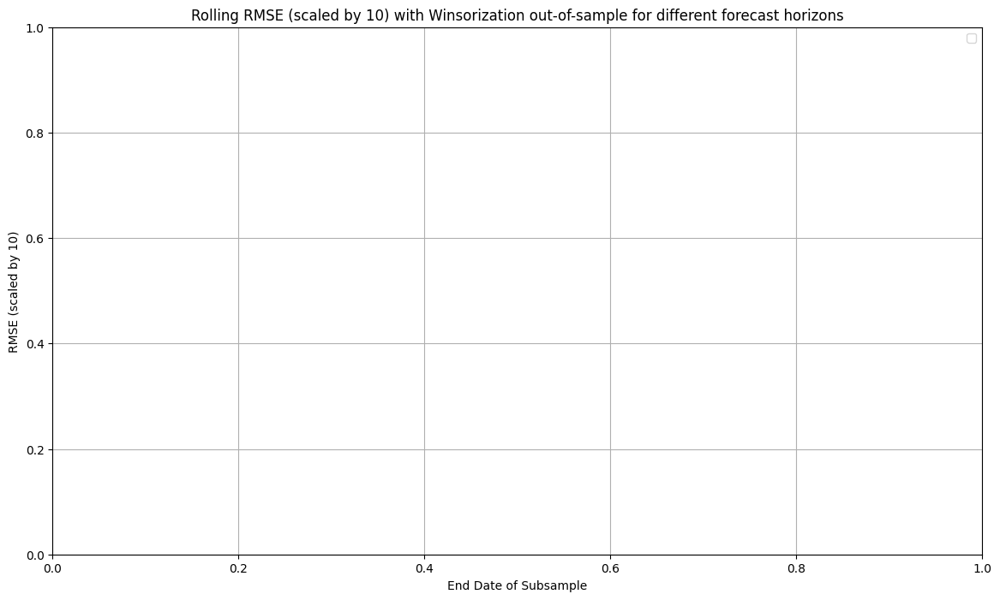

No MAE data to plot for tau=1
No MAE data to plot for tau=3
No MAE data to plot for tau=6
No MAE data to plot for tau=9


C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\2171683698.py:281: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


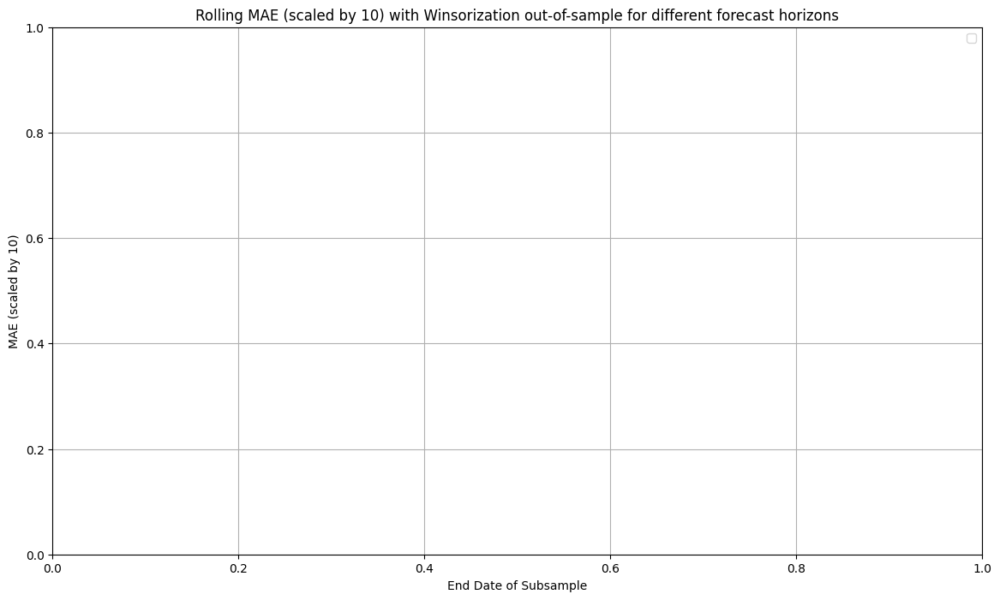

No MAD data to plot for tau=1
No MAD data to plot for tau=3
No MAD data to plot for tau=6
No MAD data to plot for tau=9


C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\2171683698.py:298: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


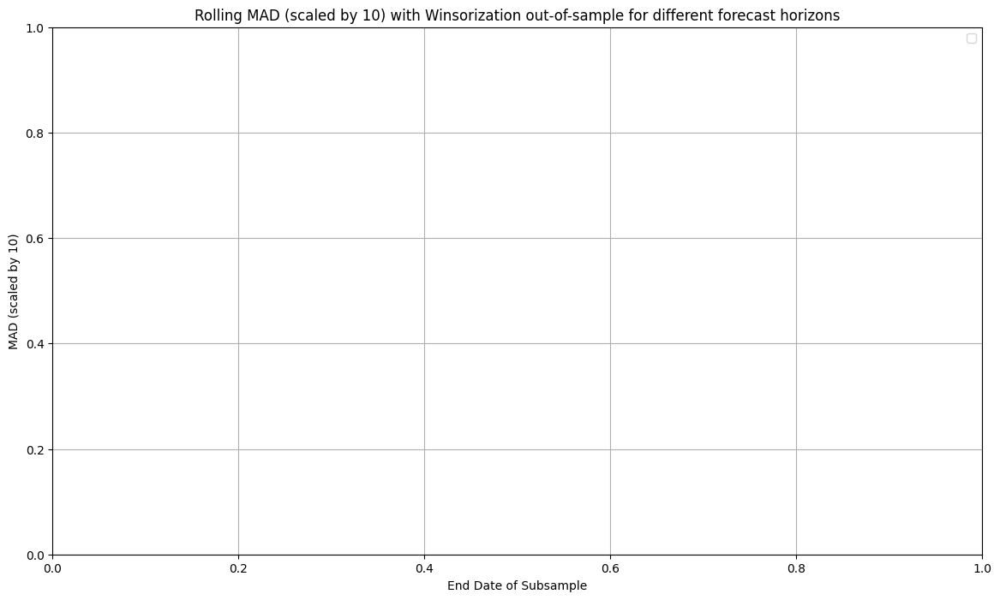

No RMSE data for tau=1
No RMSE data for tau=3
No RMSE data for tau=6
No RMSE data for tau=9


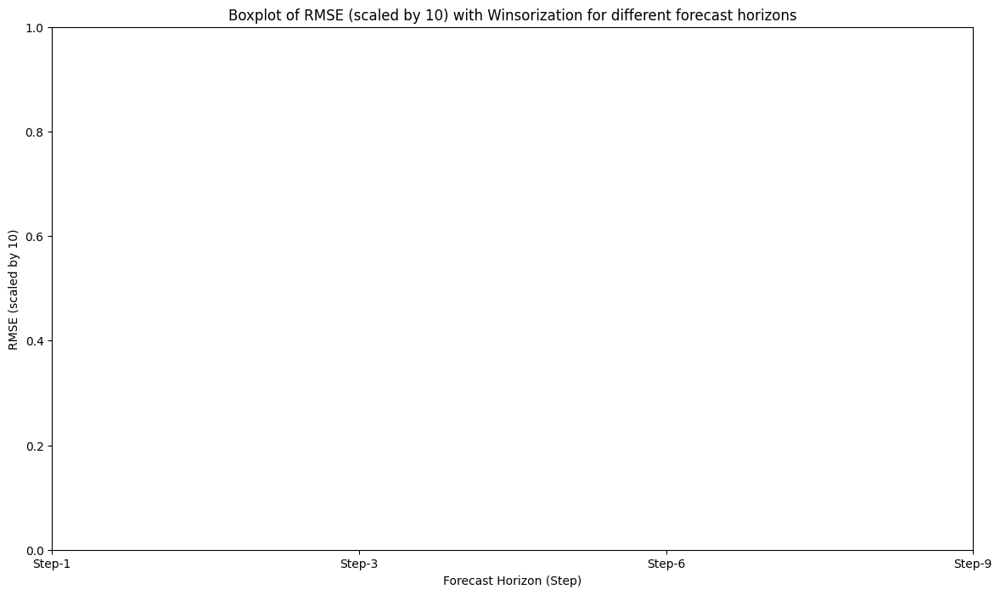

No MAE data for tau=1
No MAE data for tau=3
No MAE data for tau=6
No MAE data for tau=9


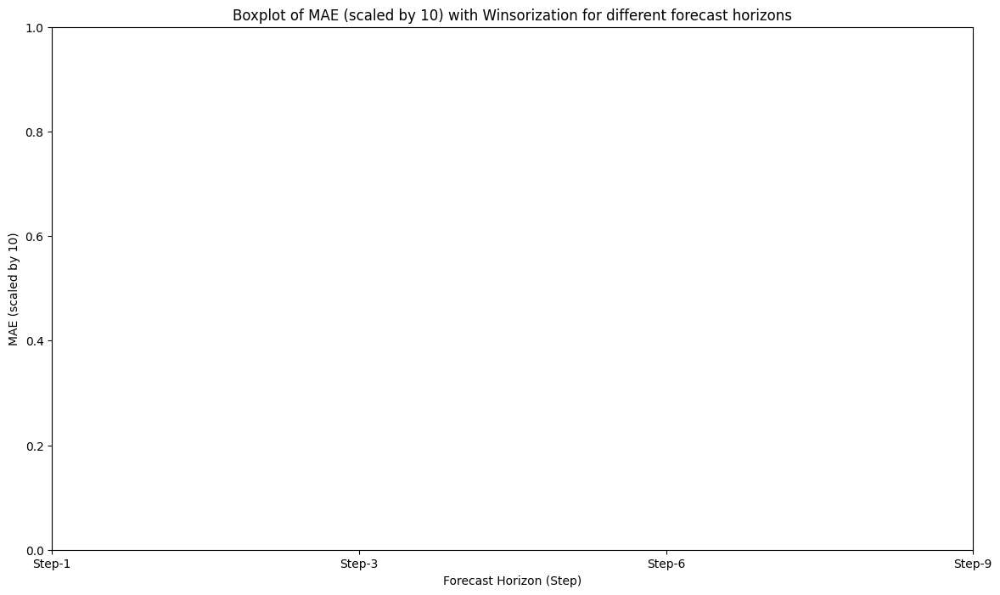

No MAD data for tau=1
No MAD data for tau=3
No MAD data for tau=6
No MAD data for tau=9


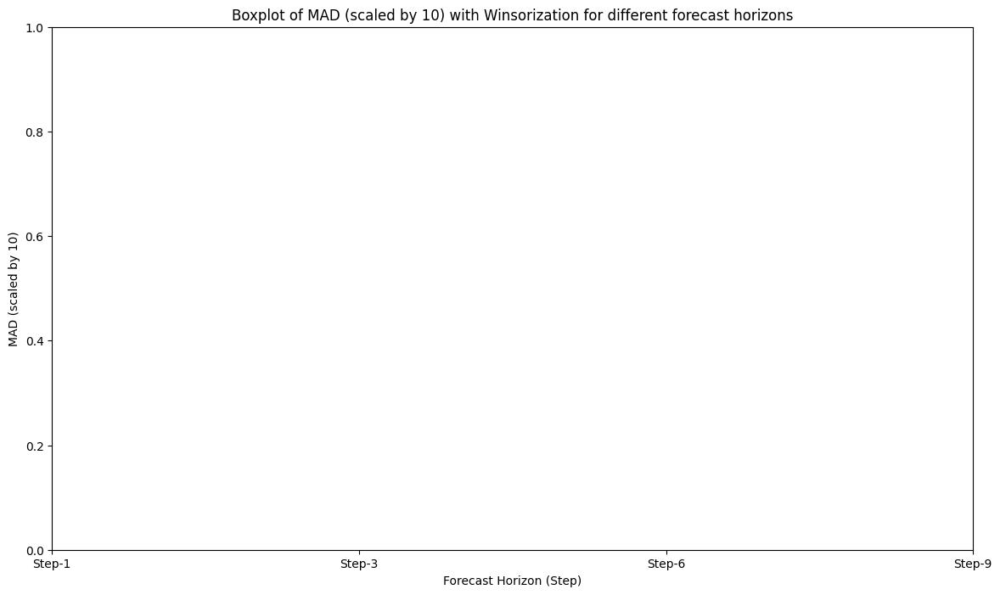

No R_SQ data for tau=1
No R_SQ data for tau=3
No R_SQ data for tau=6
No R_SQ data for tau=9


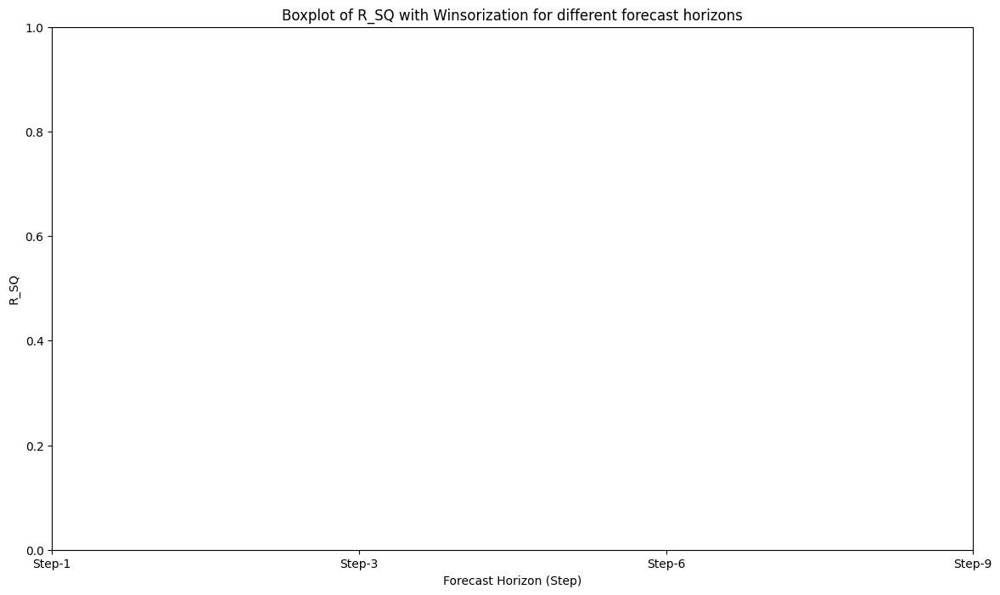

Updated code execution completed.


In [9]:
## SVM

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from pypdc_sis import PDC_SIS  # Assuming this is the function you're using
from scipy.stats import mstats
from sklearn.svm import SVR
### Part 1: Data Preparation

# Load the dataset
df = pd.read_csv('./official_data.csv')

# Extracting the GDP column as the target variable 'Y'
gdp = df['GDP']

# Extracting the predictors
data = df.iloc[:, 2:99]

# Creating lagged variables up to Lag 3
PredictLag3 = data.assign(**{
    f"{col}_lag{i}": data[col].shift(i) for i in range(1, 4) for col in data
}).reindex(columns=sorted(data.columns.tolist() + [f"{col}_lag{i}" for i in range(1, 4) for col in data], key=lambda x: (len(x), x)))

# Create a mask for non-NA rows
mask = PredictLag3.notna().all(axis=1)

# Apply the mask consistently to both X and Y
Xwl = PredictLag3[mask].to_numpy()
Y = gdp[mask].to_numpy()

print(f"Shape of Xwl: {Xwl.shape}, Shape of Y: {Y.shape}")

# Combine the date column with the predictors
dates = df['date'][mask].reset_index(drop=True)
Xwl_df = pd.DataFrame(Xwl, columns=PredictLag3.columns)
Xwl_df.insert(0, 'date', dates)

# Prepare the dataframe for rolling window analysis
df_combined = pd.concat([Xwl_df.reset_index(drop=True), pd.Series(Y, name='GDP')], axis=1)

# Function to train and fit RandomForest model with hyperparameter tuning using RandomizedSearchCV
def finetune_svm(X_train, y_train):
    model = SVR()
    param_distributions = {
        'C': [0.1, 1, 10, 100],
        'epsilon': [0.01, 0.1, 0.2],
        'kernel': ['linear', 'rbf']
    }
    random_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_distributions,
        cv=3,
        scoring='neg_mean_squared_error',
        n_jobs=-1,
        n_iter=20,  # Adjust n_iter as needed
        random_state=42  # Ensures reproducibility
    )
    random_search.fit(X_train, y_train)
    return random_search.best_estimator_

# Function to calculate out-of-sample performance metrics
def OoS_metrics(y_true, y_pred, y_train_mean):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mad = np.mean(np.abs(y_true - y_pred))
    sse = np.sum((y_true - y_pred) ** 2)
    sst = np.sum((y_true - y_train_mean) ** 2)
    
    # Handle the case where SST is zero to avoid division by zero
    if sst == 0:
        r_sq = np.nan  # Or set to 0, depending on how you want to handle it
    else:
        r_sq = 1 - (sse / sst)
    return rmse, mae, mad, r_sq

# Function to calculate rolling-window OoS performance for 'tau'-steps ahead forecasts
def OoS_R_sq(df, tau, wsize, sstart, T1, ylag, sratio=0.80):
    """
    Calculate rolling-window out-of-sample performance for 'tau'-steps ahead forecasts.

    Parameters:
    df (DataFrame): DataFrame containing the date column and predictors.
    tau (int): Forecast horizon (number of steps ahead).
    wsize (int): Rolling window size.
    sstart (int): Start index for the subsample.
    T1 (int): Subsample size.
    ylag (int): Number of lags for the target variable.

    Returns:
    tuple: (rmse, mae, mad, r_sq, selected_features_current_window) performance metrics.
    """
    # Ensure the subsample size and indices are valid
    assert T1 > wsize + tau, "Size of subsample must be greater than window size plus tau!"
    assert sstart + T1 <= len(df), "End point of the last subsample must be <= size of the dataframe!"

    # Debugging: Print current start and end indices for the rolling window
    print(f"Rolling window: Start={sstart}, End={sstart + T1}, tau={tau}")

    # Extract the subsample from the dataframe
    df_sub = df.iloc[sstart:(sstart + T1), :].copy()

    # Correct the target label by shifting it backward by 'tau' steps to align features with future targets
    df_sub['target'] = df_sub['GDP'].shift(-tau)  # Corrected shift

    df_sub.dropna(inplace=True)  # Drop rows with NaN values caused by shifting

    # Debugging: Print the first few rows of the subsample to check alignment
    print(df_sub[['date', 'target']].head(5))

    # If ylag > 0, create lagged versions of the target variable
    if ylag > 0:
        for i in range(1, ylag + 1):
            df_sub[f'ylag{i}'] = df_sub['target'].shift(i)
        df_sub.dropna(inplace=True)

    # Extract the target variable and features
    feature_columns = df_sub.columns[1:-1]  # Exclude 'date', 'GDP', and 'target'
    R = np.array(df_sub['target'], dtype='float64')
    X = df_sub[feature_columns].to_numpy(dtype='float64')

    # Splitting data into train, validation, and test sets
    T = X.shape[0]
    validation_size = 16  # Fixed validation size
    test_size = tau  # Set test size to forecast horizon
    train_size = T - validation_size - test_size

    if train_size <= 0:
        raise ValueError("Training size is non-positive. Adjust T1 or sstart.")

    # Split the data
    X_train = X[:train_size]
    y_train = R[:train_size]

    X_valid = X[train_size:train_size + validation_size]
    y_valid = R[train_size:train_size + validation_size]

    X_test = X[train_size + validation_size:train_size + validation_size + test_size]
    y_test = R[train_size + validation_size:train_size + validation_size + test_size]

    if len(y_test) < test_size:
        raise ValueError("Not enough data for the test set. Adjust T1 or sstart.")

    # Debugging: Print the sizes of the splits
    print(f"Train size: {X_train.shape[0]}, Validation size: {X_valid.shape[0]}, Test size: {X_test.shape[0]}")

    # Apply PDC-SIS on X_train and y_train to select top 8 features
    top_n_pdc_sis = min(8, X_train.shape[1])  # Select top 8 features or fewer if less features are available
    results = PDC_SIS(X_train, y_train, lags=3, top_n=top_n_pdc_sis)

    # Check if 'indices' is in results
    if 'indices' not in results or results['indices'] is None:
        raise ValueError("PDC_SIS did not return any feature indices.")

    # Retrieve indices of top 8 features
    selected_indices = results['indices']
    selected_feature_names = feature_columns[selected_indices]

    # Keep track of selected features
    selected_features_current_window = selected_feature_names.tolist()

    # Transform X_train, X_valid, X_test to have only selected features
    X_train_selected = X_train[:, selected_indices]
    X_valid_selected = X_valid[:, selected_indices]
    X_test_selected = X_test[:, selected_indices]

    # Train the model with hyperparameter tuning using RandomizedSearchCV
    model = finetune_svm(X_train_selected, y_train)

    # Predict on the test set
    y_pred = model.predict(X_test_selected)

    # Compute the mean of the training target values (baseline forecast)
    y_train_mean = np.mean(y_train)

    # Calculate out-of-sample performance metrics using the correct R-squared formula
    rmse, mae, mad, r_sq = OoS_metrics(y_test, y_pred, y_train_mean)

    
for tau in taus:
    print(f"\nProcessing tau={tau}")
    result, forecasts = OoS_R_sq_many_ssamples(
        df_combined, tau=tau, step_size=step_size, 
        wsize=wsize, T1=T1, ylag=ylag
    )
    results[tau] = result
    
    # Save the regular metrics
    result_df = pd.DataFrame(result)
    result_df.to_csv(os.path.join(output_dir, f'OoS_metrics_tau_{tau}.csv'), index=False)
    
    # Save actual vs predicted values
    if forecasts is not None:
        forecasts_filename = os.path.join(output_dir, f'actual_vs_predicted_tau_{tau}.csv')
        forecasts.to_csv(forecasts_filename, index=False)



# Define parameters
wsize = 75  # Rolling window size
T1 = 100    # Subsample size
step_size = 1
ylag = 1

# Create a directory to save results
output_dir = './OoS_metrics_SVM_off'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Step 2: Calculate performance for different forecast horizons (tau) and save the results
taus = [1, 3, 6, 9]
results = {}


for tau in taus:
    print(f"\nProcessing tau={tau}")
    result, forecasts = OoS_R_sq_many_ssamples(
        df_combined, tau=tau, step_size=step_size, 
        wsize=wsize, T1=T1, ylag=ylag
    )
    results[tau] = result
    
    # Save the regular metrics
    result_df = pd.DataFrame(result)
    result_df.to_csv(os.path.join(output_dir, f'OoS_metrics_tau_{tau}.csv'), index=False)
    
    # Save actual vs predicted values
    if forecasts is not None:
        forecasts_filename = os.path.join(output_dir, f'actual_vs_predicted_tau_{tau}.csv')
        forecasts.to_csv(forecasts_filename, index=False)

#### Winsorization ###########################################################################################################

def winsorize_data(data, limits=(0.20, 0.20)):
    # Apply Winsorization with given limits
    if len(data) == 0:
        return np.array([])
    return mstats.winsorize(data, limits=limits)

def winsorize_data_2(data, limits=(0.20, 0.20)):
    # Apply Winsorization with given limits
    if len(data) == 0:
        return np.array([])
    return mstats.winsorize(data, limits=limits)

# Step 3: Plot the rolling RMSE for each tau with Winsorization applied
plt.figure(figsize=(14, 8))
for tau, result in results.items():
    if result['rmse']:
        # Apply Winsorization to reduce the effect of outliers
        rmse_series = pd.Series(winsorize_data(np.array(result['rmse'])), index=pd.to_datetime(result['ssample_end_date'])) * 10  # Scale by 10
        rmse_series.plot(label=f'Step-{tau}')
    else:
        print(f"No RMSE data to plot for tau={tau}")

plt.title('Rolling RMSE (scaled by 10) with Winsorization out-of-sample for different forecast horizons')
plt.xlabel('End Date of Subsample')
plt.ylabel('RMSE (scaled by 10)')
plt.legend()
plt.grid(True)
plt.show()

# Rolling line chart for MAE
plt.figure(figsize=(14, 8))
for tau, result in results.items():
    if result['mae']:
        # Apply Winsorization to reduce the effect of outliers
        mae_series = pd.Series(winsorize_data(np.array(result['mae'])), index=pd.to_datetime(result['ssample_end_date'])) * 10  # Scale by 10
        mae_series.plot(label=f'Step-{tau}')
    else:
        print(f"No MAE data to plot for tau={tau}")

plt.title('Rolling MAE (scaled by 10) with Winsorization out-of-sample for different forecast horizons')
plt.xlabel('End Date of Subsample')
plt.ylabel('MAE (scaled by 10)')
plt.legend()
plt.grid(True)
plt.show()

# Rolling line chart for MAD
plt.figure(figsize=(14, 8))
for tau, result in results.items():
    if result['mad']:
        # Apply Winsorization to reduce the effect of outliers
        mad_series = pd.Series(winsorize_data(np.array(result['mad'])), index=pd.to_datetime(result['ssample_end_date'])) * 10  # Scale by 10
        mad_series.plot(label=f'Step-{tau}')
    else:
        print(f"No MAD data to plot for tau={tau}")

plt.title('Rolling MAD (scaled by 10) with Winsorization out-of-sample for different forecast horizons')
plt.xlabel('End Date of Subsample')
plt.ylabel('MAD (scaled by 10)')
plt.legend()
plt.grid(True)
plt.show()

# Step 4: Create box plots for all metrics, scaled by 10, with outlier handling
for metric in ['rmse', 'mae', 'mad']:
    plt.figure(figsize=(14, 8))
    data_to_plot = []
    for tau in taus:
        result = results[tau]
        if result[metric]:
            # Apply Winsorization to reduce the effect of outliers
            data = winsorize_data(np.array(result[metric]) * 10)
            data_to_plot.append(data)
        else:
            data_to_plot.append(np.array([]))
            print(f"No {metric.upper()} data for tau={tau}")

    sns.boxplot(data=data_to_plot)
    plt.title(f'Boxplot of {metric.upper()} (scaled by 10) with Winsorization for different forecast horizons')
    plt.xlabel('Forecast Horizon (Step)')
    plt.ylabel(f'{metric.upper()} (scaled by 10)')
    plt.xticks(ticks=range(len(taus)), labels=[f'Step-{tau}' for tau in taus])
    plt.show()

# Box plot for R-squared
for metric in ['r_sq']:
    plt.figure(figsize=(14, 8))
    data_to_plot = []
    for tau in taus:
        result = results[tau]
        if result[metric]:
            # Apply Winsorization using the new function to reduce the effect of outliers
            data = winsorize_data_2(np.array(result[metric]))
            data_to_plot.append(data)
        else:
            data_to_plot.append(np.array([]))
            print(f"No {metric.upper()} data for tau={tau}")

    sns.boxplot(data=data_to_plot)
    plt.title(f'Boxplot of {metric.upper()} with Winsorization for different forecast horizons')
    plt.xlabel('Forecast Horizon (Step)')
    plt.ylabel(f'{metric.upper()}')
    plt.xticks(ticks=range(len(taus)), labels=[f'Step-{tau}' for tau in taus])
    plt.show()

# Create directories to save metrics
output_dir_non_winsor = './OoS_metrics_SVM_off/non_winsorized'
output_dir_winsor = './OoS_metrics_SVM_off/winsorized'
os.makedirs(output_dir_non_winsor, exist_ok=True)
os.makedirs(output_dir_winsor, exist_ok=True)

# Step 5: Save non-winsorized and winsorized metrics
for tau in taus:
    result = results[tau]
    # Save the results to CSV for non-winsorized data
    result_df = pd.DataFrame(result)
    result_df.to_csv(os.path.join(output_dir_non_winsor, f'OoS_metrics_tau_{tau}_non_winsorized.csv'), index=False)

    # Apply Winsorization to reduce the effect of outliers and save adjusted metrics
    winsorized_result = {
        'sstart': result['sstart'],
        'ssample_end_date': result['ssample_end_date'],
        'rmse': winsorize_data(np.array(result['rmse'])).tolist() if result['rmse'] else [],
        'mae': winsorize_data(np.array(result['mae'])).tolist() if result['mae'] else [],
        'mad': winsorize_data(np.array(result['mad'])).tolist() if result['mad'] else [],
        'r_sq': winsorize_data_2(np.array(result['r_sq'])).tolist() if result['r_sq'] else [],
        'selected_features': result['selected_features']
    }
    winsorized_df = pd.DataFrame(winsorized_result)
    winsorized_df.to_csv(os.path.join(output_dir_winsor, f'OoS_metrics_tau_{tau}_winsorized.csv'), index=False)
    
    selected_features_df = pd.DataFrame({
        'sstart': result['sstart'],
        'ssample_end_date': result['ssample_end_date'],
        'selected_features': [', '.join(features) for features in result['selected_features']]
    })
    selected_features_filename = os.path.join(
        output_dir,
        f'selected_features_tau_{tau}.csv'
    )
    selected_features_df.to_csv(selected_features_filename, index=False)

print("Updated code execution completed.")


C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\1715718372.py:28: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  PredictLag3 = data.assign(**{
C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\1715718372.py:28: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  PredictLag3 = data.assign(**{
C:\Users\shafiullah.qureshi\AppData\Local\Temp\ipykernel_7528\1715718372.py:28: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performan

Shape of Xwl: (209, 388), Shape of Y: (209,)

Processing tau=1
Rolling window: Start=0, End=100, tau=1
         date    target
0  2004-05-01  0.004531
1  2004-06-01  0.000698
2  2004-07-01  0.004559
3  2004-08-01  0.002773
4  2004-09-01  0.001207
Train size: 81, Validation size: 16, Test size: 1
Rolling window: Start=1, End=101, tau=1
         date    target
1  2004-06-01  0.000698
2  2004-07-01  0.004559
3  2004-08-01  0.002773
4  2004-09-01  0.001207
5  2004-10-01  0.001471
Train size: 81, Validation size: 16, Test size: 1
Rolling window: Start=2, End=102, tau=1
         date    target
2  2004-07-01  0.004559
3  2004-08-01  0.002773
4  2004-09-01  0.001207
5  2004-10-01  0.001471
6  2004-11-01  0.000511
Train size: 81, Validation size: 16, Test size: 1
Rolling window: Start=3, End=103, tau=1
         date    target
3  2004-08-01  0.002773
4  2004-09-01  0.001207
5  2004-10-01  0.001471
6  2004-11-01  0.000511
7  2004-12-01  0.004109
Train size: 81, Validation size: 16, Test size: 1
R

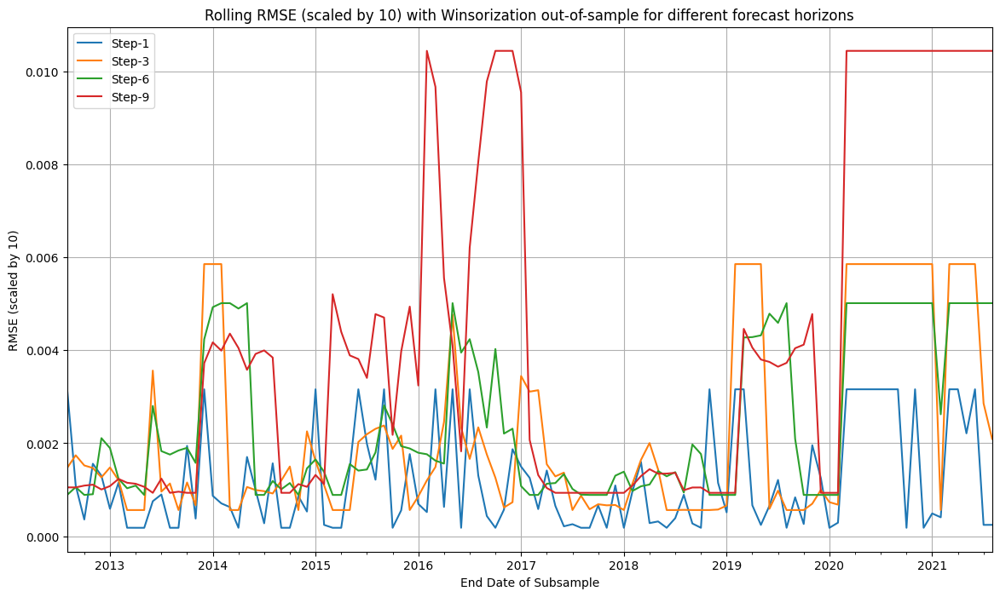

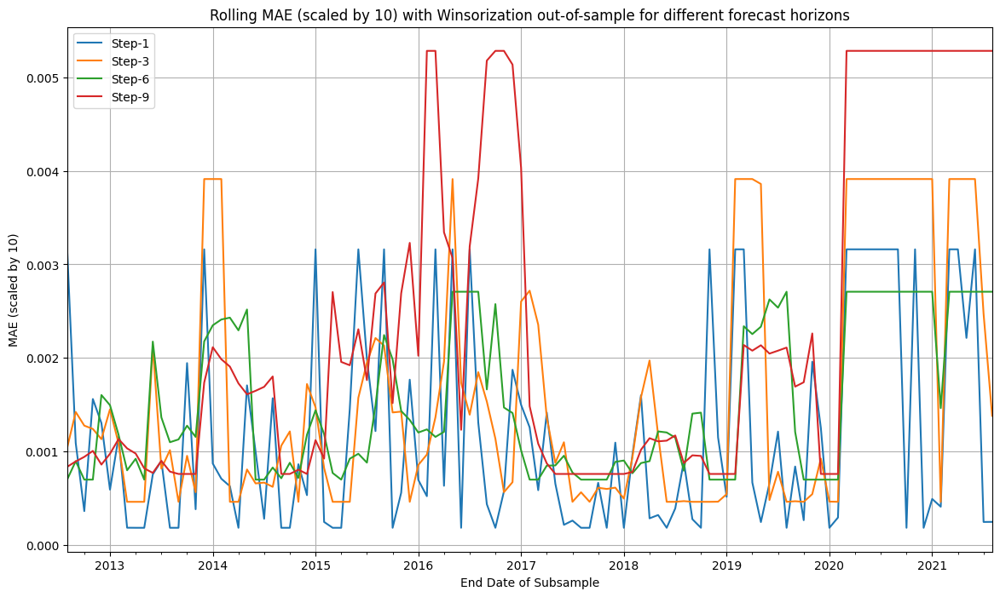

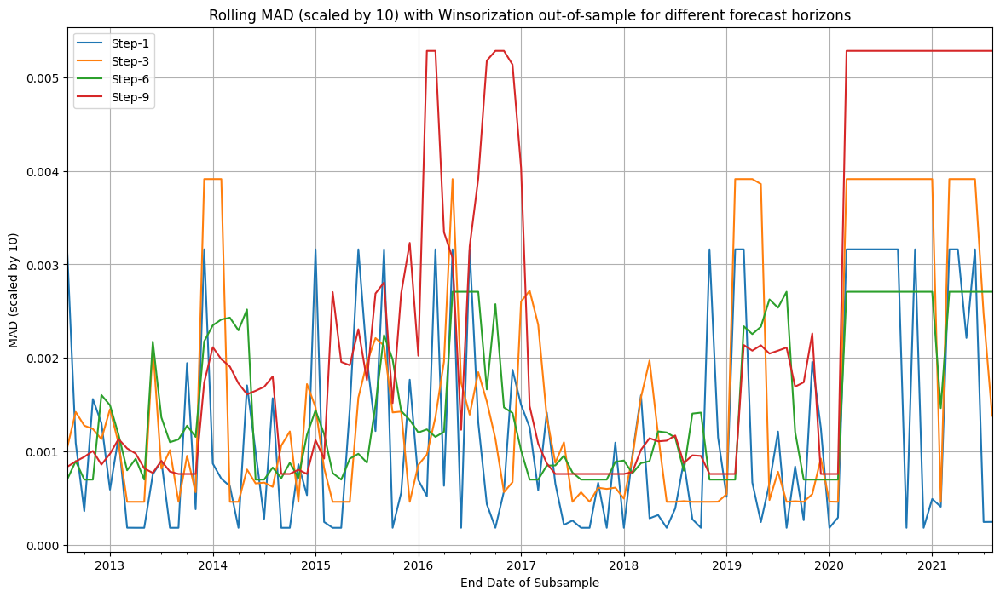

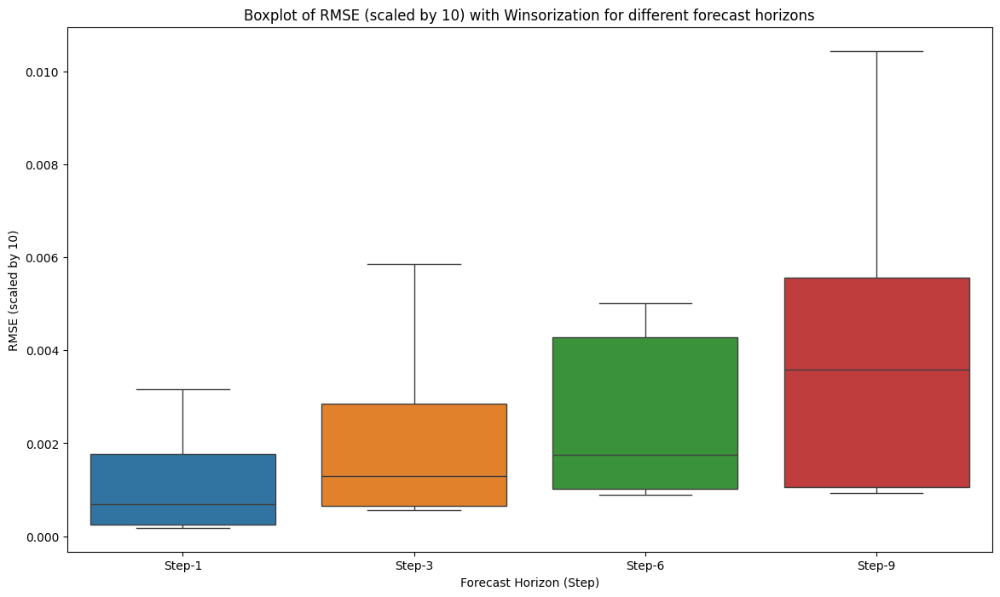

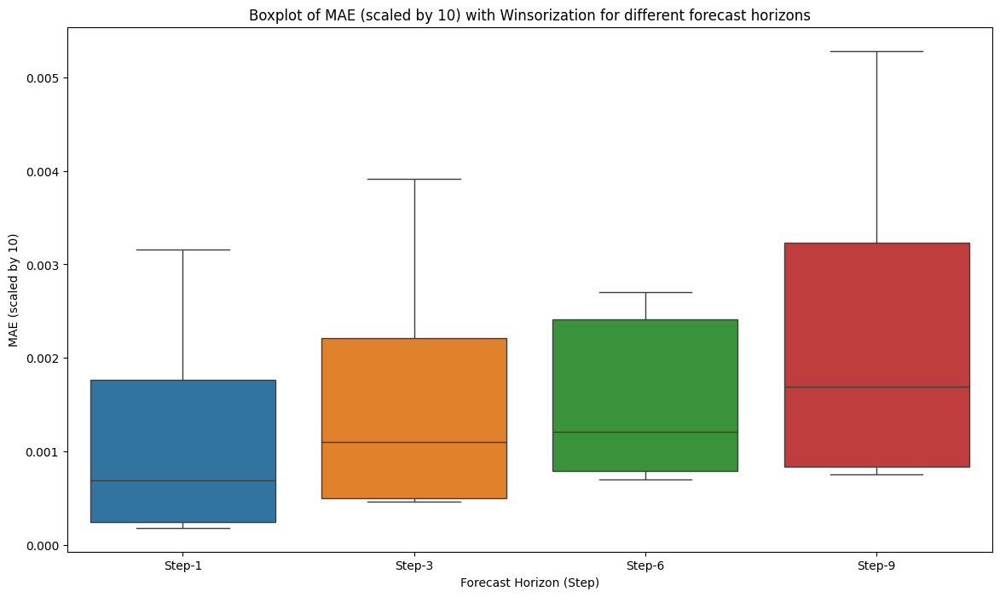

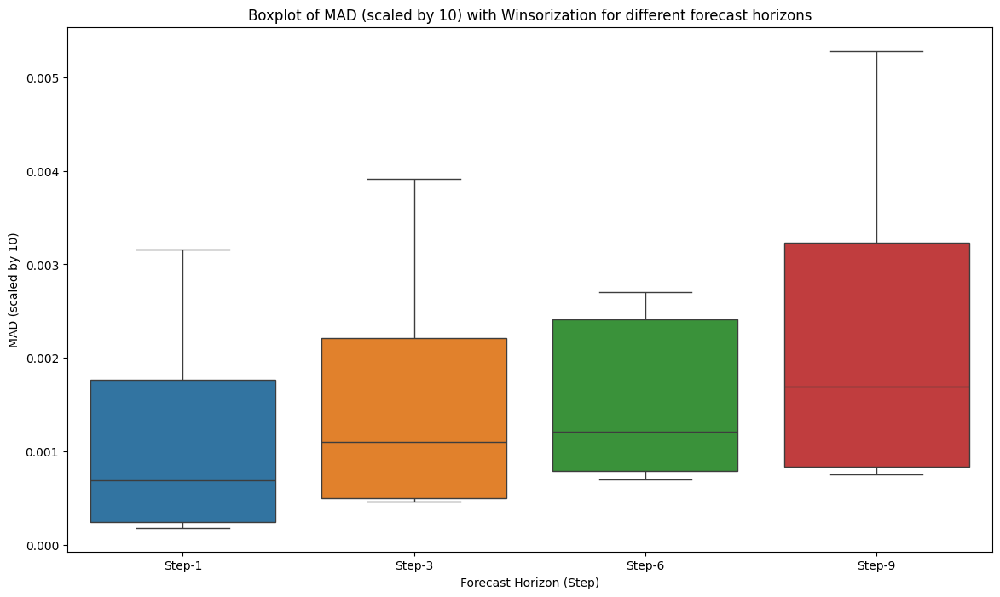

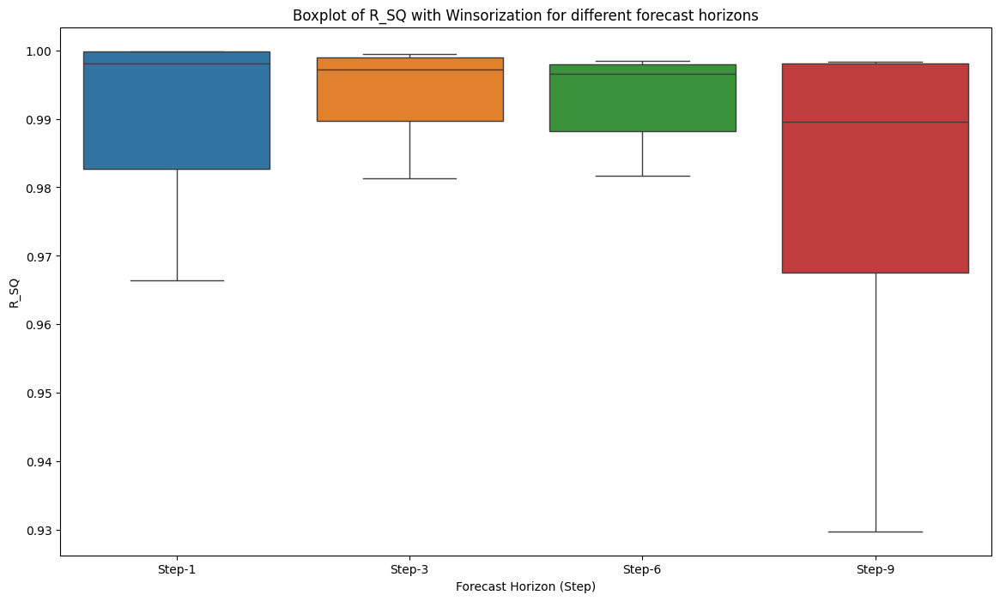

Updated code execution completed.


In [10]:

## GBM

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from pypdc_sis import PDC_SIS  # Assuming this is the function you're using
from scipy.stats import mstats
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import RandomizedSearchCV
### Part 1: Data Preparation

# Load the dataset
df = pd.read_csv('./official_data.csv')

# Extracting the GDP column as the target variable 'Y'
gdp = df['GDP']

# Extracting the predictors
data = df.iloc[:, 2:99]

# Creating lagged variables up to Lag 3
PredictLag3 = data.assign(**{
    f"{col}_lag{i}": data[col].shift(i) for i in range(1, 4) for col in data
}).reindex(columns=sorted(data.columns.tolist() + [f"{col}_lag{i}" for i in range(1, 4) for col in data], key=lambda x: (len(x), x)))

# Create a mask for non-NA rows
mask = PredictLag3.notna().all(axis=1)

# Apply the mask consistently to both X and Y
Xwl = PredictLag3[mask].to_numpy()
Y = gdp[mask].to_numpy()

print(f"Shape of Xwl: {Xwl.shape}, Shape of Y: {Y.shape}")

# Combine the date column with the predictors
dates = df['date'][mask].reset_index(drop=True)
Xwl_df = pd.DataFrame(Xwl, columns=PredictLag3.columns)
Xwl_df.insert(0, 'date', dates)

# Prepare the dataframe for rolling window analysis
df_combined = pd.concat([Xwl_df.reset_index(drop=True), pd.Series(Y, name='GDP')], axis=1)

# Function to train and fit RandomForest model with hyperparameter tuning using RandomizedSearchCV
def tune_and_fit_gbm(X_train, y_train):
 

    # Define the parameter grid for tuning
    param_distributions = {
        'n_estimators': [100, 200, 500],
        'learning_rate': [0.01,0.03,  0.05, 0.1, 0.2],
        'max_depth': [3, 4, 5, 6, 7],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'subsample': [0.6, 0.8, 1.0],
        'max_features': ['sqrt', 'log2', None]
    }
    
    gbm = GradientBoostingRegressor(random_state=42)
    
    n_samples = len(y_train)
    n_splits = min(3, n_samples)
    if n_splits < 2:
        # Cannot do cross-validation with less than 2 splits
        print(f"Not enough samples ({n_samples}) for cross-validation. Skipping hyperparameter tuning.")
        gbm.fit(X_train, y_train)
        return gbm
    else:
        random_search = RandomizedSearchCV(
            estimator=gbm,
            param_distributions=param_distributions,
            n_iter=10,
            cv=n_splits,
            n_jobs=-1,
            random_state=42,
            scoring='neg_mean_squared_error'
        )
        random_search.fit(X_train, y_train)
        return random_search.best_estimator_

# Function to calculate out-of-sample performance metrics
def OoS_metrics(y_true, y_pred, y_train_mean):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mad = np.mean(np.abs(y_true - y_pred))
    sse = np.sum((y_true - y_pred) ** 2)
    sst = np.sum((y_true - y_train_mean) ** 2)
    
    # Handle the case where SST is zero to avoid division by zero
    if sst == 0:
        r_sq = np.nan  # Or set to 0, depending on how you want to handle it
    else:
        r_sq = 1 - (sse / sst)
    return rmse, mae, mad, r_sq

# Function to calculate rolling-window OoS performance for 'tau'-steps ahead forecasts
def OoS_R_sq(df, tau, wsize, sstart, T1, ylag, sratio=0.80):
    """
    Calculate rolling-window out-of-sample performance for 'tau'-steps ahead forecasts.

    Parameters:
    df (DataFrame): DataFrame containing the date column and predictors.
    tau (int): Forecast horizon (number of steps ahead).
    wsize (int): Rolling window size.
    sstart (int): Start index for the subsample.
    T1 (int): Subsample size.
    ylag (int): Number of lags for the target variable.

    Returns:
    tuple: (rmse, mae, mad, r_sq, selected_features_current_window) performance metrics.
    """
    # Ensure the subsample size and indices are valid
    assert T1 > wsize + tau, "Size of subsample must be greater than window size plus tau!"
    assert sstart + T1 <= len(df), "End point of the last subsample must be <= size of the dataframe!"

    # Debugging: Print current start and end indices for the rolling window
    print(f"Rolling window: Start={sstart}, End={sstart + T1}, tau={tau}")

    # Extract the subsample from the dataframe
    df_sub = df.iloc[sstart:(sstart + T1), :].copy()

    # Correct the target label by shifting it backward by 'tau' steps to align features with future targets
    df_sub['target'] = df_sub['GDP'].shift(-tau)  # Corrected shift

    df_sub.dropna(inplace=True)  # Drop rows with NaN values caused by shifting

    # Debugging: Print the first few rows of the subsample to check alignment
    print(df_sub[['date', 'target']].head(5))

    # If ylag > 0, create lagged versions of the target variable
    if ylag > 0:
        for i in range(1, ylag + 1):
            df_sub[f'ylag{i}'] = df_sub['target'].shift(i)
        df_sub.dropna(inplace=True)

    # Extract the target variable and features
    feature_columns = df_sub.columns[1:-1]  # Exclude 'date', 'GDP', and 'target'
    R = np.array(df_sub['target'], dtype='float64')
    X = df_sub[feature_columns].to_numpy(dtype='float64')

    # Splitting data into train, validation, and test sets
    T = X.shape[0]
    validation_size = 16  # Fixed validation size
    test_size = tau  # Set test size to forecast horizon
    train_size = T - validation_size - test_size

    if train_size <= 0:
        raise ValueError("Training size is non-positive. Adjust T1 or sstart.")

    # Split the data
    X_train = X[:train_size]
    y_train = R[:train_size]

    X_valid = X[train_size:train_size + validation_size]
    y_valid = R[train_size:train_size + validation_size]

    X_test = X[train_size + validation_size:train_size + validation_size + test_size]
    y_test = R[train_size + validation_size:train_size + validation_size + test_size]

    if len(y_test) < test_size:
        raise ValueError("Not enough data for the test set. Adjust T1 or sstart.")

    # Debugging: Print the sizes of the splits
    print(f"Train size: {X_train.shape[0]}, Validation size: {X_valid.shape[0]}, Test size: {X_test.shape[0]}")

    # Apply PDC-SIS on X_train and y_train to select top 8 features
    top_n_pdc_sis = min(8, X_train.shape[1])  # Select top 8 features or fewer if less features are available
    results = PDC_SIS(X_train, y_train, lags=3, top_n=top_n_pdc_sis)

    # Check if 'indices' is in results
    if 'indices' not in results or results['indices'] is None:
        raise ValueError("PDC_SIS did not return any feature indices.")

    # Retrieve indices of top 8 features
    selected_indices = results['indices']
    selected_feature_names = feature_columns[selected_indices]

    # Keep track of selected features
    selected_features_current_window = selected_feature_names.tolist()

    # Transform X_train, X_valid, X_test to have only selected features
    X_train_selected = X_train[:, selected_indices]
    X_valid_selected = X_valid[:, selected_indices]
    X_test_selected = X_test[:, selected_indices]

    # Train the model with hyperparameter tuning using RandomizedSearchCV
    model = tune_and_fit_gbm(X_train_selected, y_train)

    # Predict on the test set
    y_pred = model.predict(X_test_selected)

    # Compute the mean of the training target values (baseline forecast)
    y_train_mean = np.mean(y_train)

    # Calculate out-of-sample performance metrics using the correct R-squared formula
    rmse, mae, mad, r_sq = OoS_metrics(y_test, y_pred, y_train_mean)

    # After making predictions, store actual and predicted values along with dates
    test_dates = df_sub.iloc[train_size + validation_size:train_size + validation_size + test_size]['date']
    forecast_results = pd.DataFrame({
        'date': test_dates,
        'actual': y_test,
        'predicted': y_pred,
        'sstart': sstart,
        'window_end': df.iloc[sstart + T1 - 1]['date']
    })
    
    # Calculate metrics
    rmse, mae, mad, r_sq = OoS_metrics(y_test, y_pred, y_train_mean)
    
    return rmse, mae, mad, r_sq, selected_features_current_window, forecast_results

def OoS_R_sq_many_ssamples(df, tau, step_size, wsize, T1, ylag, sratio=0.80):
    ssize = len(df) - ylag
    perf_dict = {
        'sstart': [], 'ssample_end_date': [], 
        'rmse': [], 'mae': [], 'mad': [], 'r_sq': [], 
        'selected_features': []
    }
    
    # Add this line to store all forecasts
    all_forecasts = []
    
    for sstart in range(0, ssize + step_size, step_size):
        if sstart + T1 <= ssize:
            try:
                # Update function call to include forecast_results
                rmse, mae, mad, r_sq, selected_features, forecast_results = OoS_R_sq(
                    df, tau, wsize, sstart, T1, ylag, sratio
                )
                perf_dict['sstart'].append(sstart)
                perf_dict['ssample_end_date'].append(df.iloc[sstart + T1 - 1]['date'])
                perf_dict['rmse'].append(rmse)
                perf_dict['mae'].append(mae)
                perf_dict['mad'].append(mad)
                perf_dict['r_sq'].append(r_sq)
                perf_dict['selected_features'].append(selected_features)
                
                # Add this line to collect forecast results
                all_forecasts.append(forecast_results)
                
            except Exception as e:
                print(f"An error occurred at sstart={sstart}: {e}")
    
    # Add this section to combine and return forecasts
    if all_forecasts:
        combined_forecasts = pd.concat(all_forecasts, ignore_index=True)
        return perf_dict, combined_forecasts
    return perf_dict, None 

# Define parameters
wsize = 75  # Rolling window size
T1 = 100    # Subsample size
step_size = 1
ylag = 1

# Create a directory to save results
output_dir = './OoS_metrics_GBM_off'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Step 2: Calculate performance for different forecast horizons (tau) and save the results
taus = [1, 3, 6, 9]
results = {}


for tau in taus:
    print(f"\nProcessing tau={tau}")
    result, forecasts = OoS_R_sq_many_ssamples(
        df_combined, tau=tau, step_size=step_size, 
        wsize=wsize, T1=T1, ylag=ylag
    )
    results[tau] = result
    
    # Save the regular metrics
    result_df = pd.DataFrame(result)
    result_df.to_csv(os.path.join(output_dir, f'OoS_metrics_tau_{tau}.csv'), index=False)
    
    # Save actual vs predicted values
    if forecasts is not None:
        forecasts_filename = os.path.join(output_dir, f'actual_vs_predicted_tau_{tau}.csv')
        forecasts.to_csv(forecasts_filename, index=False)
#### Winsorization ###########################################################################################################

def winsorize_data(data, limits=(0.20, 0.20)):
    # Apply Winsorization with given limits
    if len(data) == 0:
        return np.array([])
    return mstats.winsorize(data, limits=limits)

def winsorize_data_2(data, limits=(0.20, 0.20)):
    # Apply Winsorization with given limits
    if len(data) == 0:
        return np.array([])
    return mstats.winsorize(data, limits=limits)

# Step 3: Plot the rolling RMSE for each tau with Winsorization applied
plt.figure(figsize=(14, 8))
for tau, result in results.items():
    if result['rmse']:
        # Apply Winsorization to reduce the effect of outliers
        rmse_series = pd.Series(winsorize_data(np.array(result['rmse'])), index=pd.to_datetime(result['ssample_end_date'])) * 10  # Scale by 10
        rmse_series.plot(label=f'Step-{tau}')
    else:
        print(f"No RMSE data to plot for tau={tau}")

plt.title('Rolling RMSE (scaled by 10) with Winsorization out-of-sample for different forecast horizons')
plt.xlabel('End Date of Subsample')
plt.ylabel('RMSE (scaled by 10)')
plt.legend()
plt.grid(True)
plt.show()

# Rolling line chart for MAE
plt.figure(figsize=(14, 8))
for tau, result in results.items():
    if result['mae']:
        # Apply Winsorization to reduce the effect of outliers
        mae_series = pd.Series(winsorize_data(np.array(result['mae'])), index=pd.to_datetime(result['ssample_end_date'])) * 10  # Scale by 10
        mae_series.plot(label=f'Step-{tau}')
    else:
        print(f"No MAE data to plot for tau={tau}")

plt.title('Rolling MAE (scaled by 10) with Winsorization out-of-sample for different forecast horizons')
plt.xlabel('End Date of Subsample')
plt.ylabel('MAE (scaled by 10)')
plt.legend()
plt.grid(True)
plt.show()

# Rolling line chart for MAD
plt.figure(figsize=(14, 8))
for tau, result in results.items():
    if result['mad']:
        # Apply Winsorization to reduce the effect of outliers
        mad_series = pd.Series(winsorize_data(np.array(result['mad'])), index=pd.to_datetime(result['ssample_end_date'])) * 10  # Scale by 10
        mad_series.plot(label=f'Step-{tau}')
    else:
        print(f"No MAD data to plot for tau={tau}")

plt.title('Rolling MAD (scaled by 10) with Winsorization out-of-sample for different forecast horizons')
plt.xlabel('End Date of Subsample')
plt.ylabel('MAD (scaled by 10)')
plt.legend()
plt.grid(True)
plt.show()

# Step 4: Create box plots for all metrics, scaled by 10, with outlier handling
for metric in ['rmse', 'mae', 'mad']:
    plt.figure(figsize=(14, 8))
    data_to_plot = []
    for tau in taus:
        result = results[tau]
        if result[metric]:
            # Apply Winsorization to reduce the effect of outliers
            data = winsorize_data(np.array(result[metric]) * 10)
            data_to_plot.append(data)
        else:
            data_to_plot.append(np.array([]))
            print(f"No {metric.upper()} data for tau={tau}")

    sns.boxplot(data=data_to_plot)
    plt.title(f'Boxplot of {metric.upper()} (scaled by 10) with Winsorization for different forecast horizons')
    plt.xlabel('Forecast Horizon (Step)')
    plt.ylabel(f'{metric.upper()} (scaled by 10)')
    plt.xticks(ticks=range(len(taus)), labels=[f'Step-{tau}' for tau in taus])
    plt.show()

# Box plot for R-squared
for metric in ['r_sq']:
    plt.figure(figsize=(14, 8))
    data_to_plot = []
    for tau in taus:
        result = results[tau]
        if result[metric]:
            # Apply Winsorization using the new function to reduce the effect of outliers
            data = winsorize_data_2(np.array(result[metric]))
            data_to_plot.append(data)
        else:
            data_to_plot.append(np.array([]))
            print(f"No {metric.upper()} data for tau={tau}")

    sns.boxplot(data=data_to_plot)
    plt.title(f'Boxplot of {metric.upper()} with Winsorization for different forecast horizons')
    plt.xlabel('Forecast Horizon (Step)')
    plt.ylabel(f'{metric.upper()}')
    plt.xticks(ticks=range(len(taus)), labels=[f'Step-{tau}' for tau in taus])
    plt.show()

# Create directories to save metrics
output_dir_non_winsor = './OoS_metrics_GBM_off/non_winsorized'
output_dir_winsor = './OoS_metrics_GBM_off/winsorized'
os.makedirs(output_dir_non_winsor, exist_ok=True)
os.makedirs(output_dir_winsor, exist_ok=True)

# Step 5: Save non-winsorized and winsorized metrics
for tau in taus:
    result = results[tau]
    # Save the results to CSV for non-winsorized data
    result_df = pd.DataFrame(result)
    result_df.to_csv(os.path.join(output_dir_non_winsor, f'OoS_metrics_tau_{tau}_non_winsorized.csv'), index=False)

    # Apply Winsorization to reduce the effect of outliers and save adjusted metrics
    winsorized_result = {
        'sstart': result['sstart'],
        'ssample_end_date': result['ssample_end_date'],
        'rmse': winsorize_data(np.array(result['rmse'])).tolist() if result['rmse'] else [],
        'mae': winsorize_data(np.array(result['mae'])).tolist() if result['mae'] else [],
        'mad': winsorize_data(np.array(result['mad'])).tolist() if result['mad'] else [],
        'r_sq': winsorize_data_2(np.array(result['r_sq'])).tolist() if result['r_sq'] else [],
        'selected_features': result['selected_features']
    }
    winsorized_df = pd.DataFrame(winsorized_result)
    winsorized_df.to_csv(os.path.join(output_dir_winsor, f'OoS_metrics_tau_{tau}_winsorized.csv'), index=False)
    
    selected_features_df = pd.DataFrame({
        'sstart': result['sstart'],
        'ssample_end_date': result['ssample_end_date'],
        'selected_features': [', '.join(features) for features in result['selected_features']]
    })
    selected_features_filename = os.path.join(
        output_dir,
        f'selected_features_tau_{tau}.csv'
    )
    selected_features_df.to_csv(selected_features_filename, index=False)

print("Updated code execution completed.")
